In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.spatial.distance import cosine
from sktime.datasets import load_airline
from sktime.transformations.series.adapt import TabularToSeriesAdaptor
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np
from sktime.transformations.series.detrend import Detrender
from sktime.transformations.series.detrend import Deseasonalizer
from sktime.pipeline import make_pipeline

# Identifying threshold

In [2]:
import os
dir_path = 'time_series/'
len_threshold = 1400

In [4]:

import numpy as np

# Carica i dati
X = np.load('X_finale.npy')
y = np.load('y_finale.npy')
ids = np.load('ids_finale.npy')

# Inizializza le variabili per tenere traccia dei sample per genere
genre_count = {}

# Inizializza le liste per i nuovi dati estratti
X_sampled, y_sampled, ids_sampled = [], [], []

# Numero massimo di sample per genere
max_samples_per_genre = 100

# Loop attraverso i dati per selezionare 100 sample per genere
for i in range(len(X)):
    genre = y[i]
    if genre not in genre_count:
        genre_count[genre] = 0

    # Se non abbiamo ancora selezionato 100 sample per questo genere
    if genre_count[genre] < max_samples_per_genre:
        X_sampled.append(X[i])
        y_sampled.append(y[i])
        ids_sampled.append(ids[i])
        genre_count[genre] += 1

    # Se abbiamo già selezionato 100 sample per questo genere, passiamo al prossimo
    else:
        continue

# Converti le liste in numpy arrays
X_sampled = np.array(X_sampled)
y_sampled = np.array(y_sampled)
ids_sampled = np.array(ids_sampled)

# Ora X_sampled contiene 100 sample per genere


In [5]:
#X=X_sampled
#y=y_sampled
#ids=ids_sampled

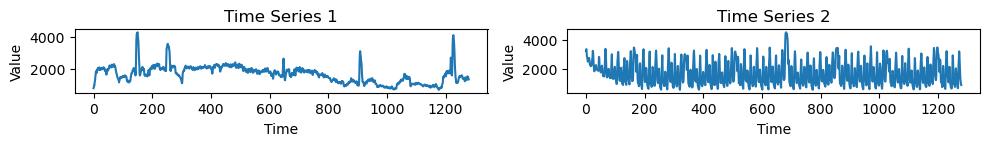

In [6]:
# Plot the first 10 time series
plt.figure(figsize=(10, 6))
for i in range(2):
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns, i+1 is the plot index
    plt.plot(X[i][0])  # Assuming X is a list of lists where each inner list contains a single time series
    plt.title(f"Time Series {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Value")
plt.tight_layout()
plt.show()

In [7]:
X


array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[2744.44416673, 2714.7230879 , 2696.45324601, ...,
         3747.16287653, 3684.38455206, 3837.18621856]],

       [[1679.19150849, 1371.38211376, 1276.83064524, ...,
         1590.93902708, 1215.85383607, 1044.4196475 ]],

       [[1760.40333559, 1669.68354612, 1690.64028044, ...,
         2342.71927807, 3021.21525668, 3253.65964701]]])

### We can note no info after 1200...so we set 1280 as treshold

In [8]:
len_threshold = 1280   #cause >1280 no infos in ts 

# Loading TS

In [9]:
# Ottieni i valori unici e le loro frequenze
valori_unici, conteggi = np.unique(y_sampled, return_counts=True)

# Stampare il numero di volte che ogni classe appare
for classe, conteggio in zip(valori_unici, conteggi):
    print(f"{classe}: {conteggio}")

emo: 100
folk: 100
goth: 100
happy: 100
heavy-metal: 100
honky-tonk: 100
j-idol: 100
kids: 100
minimal-techno: 100
mpb: 100
new-age: 100
opera: 100
piano: 100
progressive-house: 100
salsa: 100
sertanejo: 100
sleep: 100
songwriter: 100
synth-pop: 100
world-music: 100


In [10]:
X_sampled

array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[1004.73292675,  962.25338811,  823.78375238, ...,
         2530.32290567, 2382.42077134, 2245.26986993]],

       [[2142.66155273, 2147.55776745, 2167.81571791, ...,
         2912.10105441, 2711.93110861, 2354.17905003]],

       [[ 442.01375236,  508.74586593,  616.79972072, ...,
         1317.7799905 , 1582.82262903, 1548.48270035]]])

In [11]:
X

array([[[ 768.95392809,  828.02258438,  941.38630447, ...,
         1442.91478617, 1391.23601795, 1321.28390846]],

       [[3230.21111891, 3344.52008121, 3136.68604971, ...,
         1130.3803975 ,  978.28691948,  899.69898037]],

       [[2192.69421881, 1986.90485659, 2082.59886419, ...,
         3533.68370914, 3432.65255657, 3476.44208633]],

       ...,

       [[2744.44416673, 2714.7230879 , 2696.45324601, ...,
         3747.16287653, 3684.38455206, 3837.18621856]],

       [[1679.19150849, 1371.38211376, 1276.83064524, ...,
         1590.93902708, 1215.85383607, 1044.4196475 ]],

       [[1760.40333559, 1669.68354612, 1690.64028044, ...,
         2342.71927807, 3021.21525668, 3253.65964701]]])

In [12]:
len(y_sampled)

2000

In [13]:
y_sampled

array(['opera', 'minimal-techno', 'goth', ..., 'salsa', 'salsa',
       'songwriter'], dtype='<U17')

In [14]:
len(ids_sampled)

2000

In [15]:
import numpy as np

# Conta il numero di generi unici presenti nella lista y
unique_genres = np.unique(y_sampled)
num_unique_genres = len(unique_genres)

print("Numero di generi unici:", num_unique_genres)
print('generi unici:', unique_genres)


Numero di generi unici: 20
generi unici: ['emo' 'folk' 'goth' 'happy' 'heavy-metal' 'honky-tonk' 'j-idol' 'kids'
 'minimal-techno' 'mpb' 'new-age' 'opera' 'piano' 'progressive-house'
 'salsa' 'sertanejo' 'sleep' 'songwriter' 'synth-pop' 'world-music']


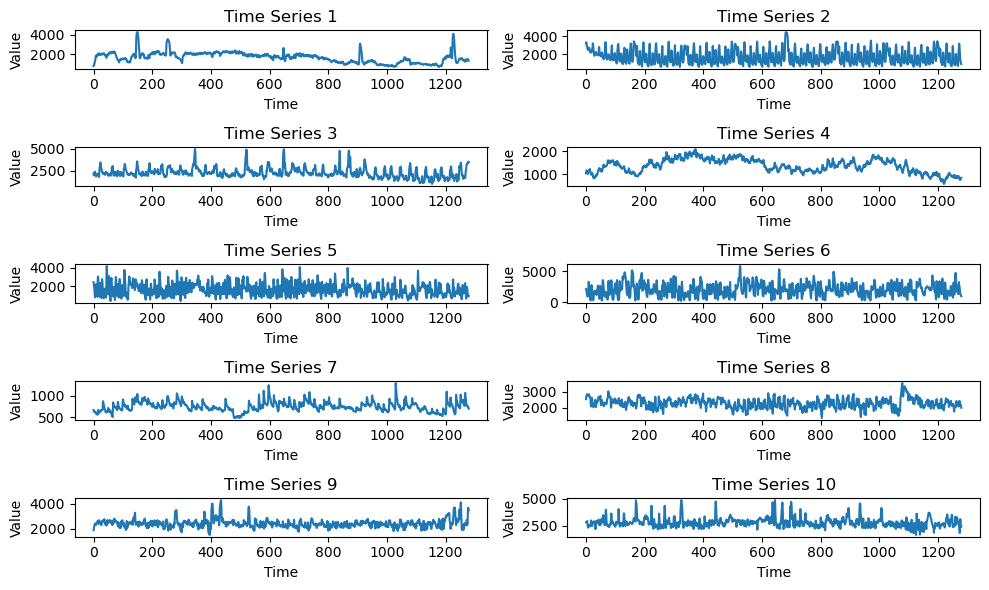

In [16]:
# Plot the first 10 time series
plt.figure(figsize=(10, 6))
for i in range(10):
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns, i+1 is the plot index
    plt.plot(X_sampled[i][0])  # Assuming X is a list of lists where each inner list contains a single time series
    plt.title(f"Time Series {i+1}")
    plt.xlabel("Time")
    plt.ylabel("Value")
plt.tight_layout()
plt.show()

# Trasformazioni (amplitude scaling, noise)  win size= 100

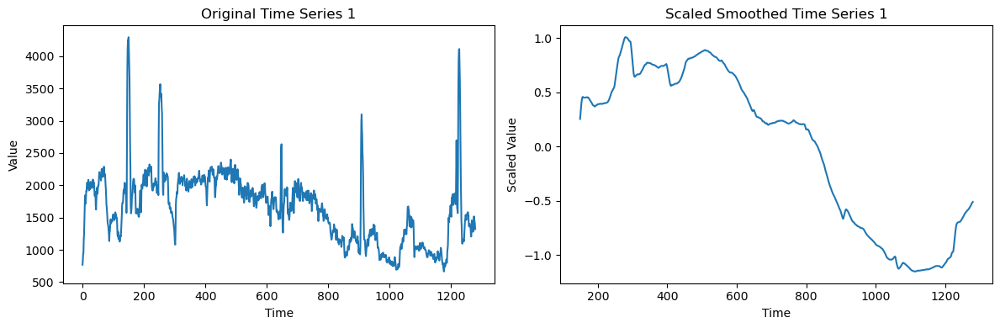

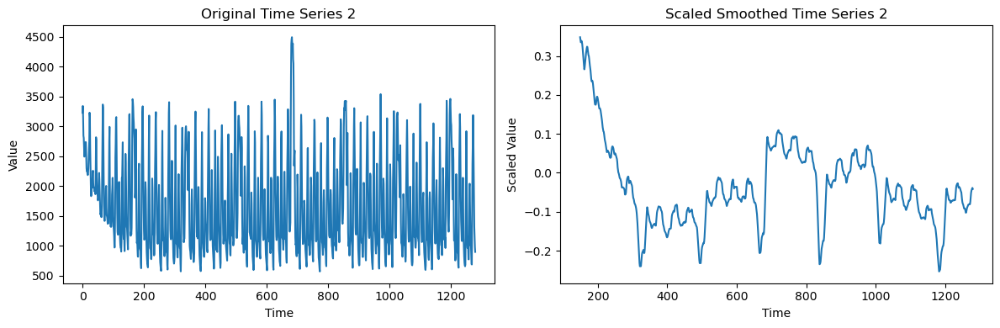

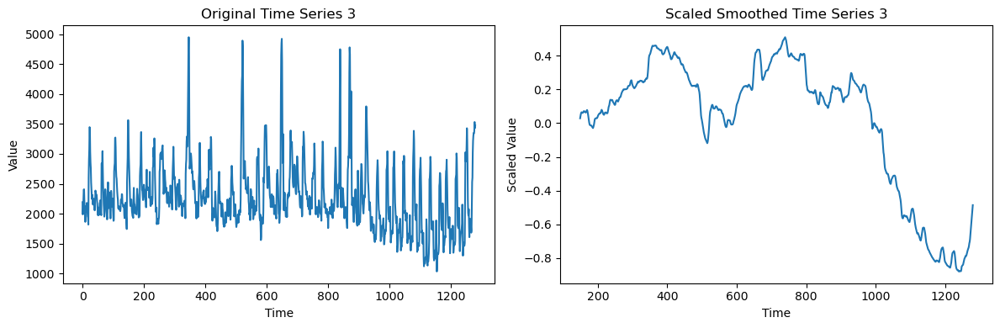

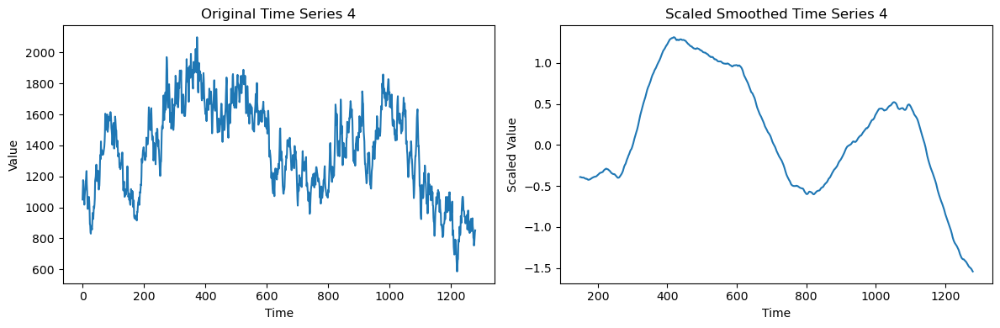

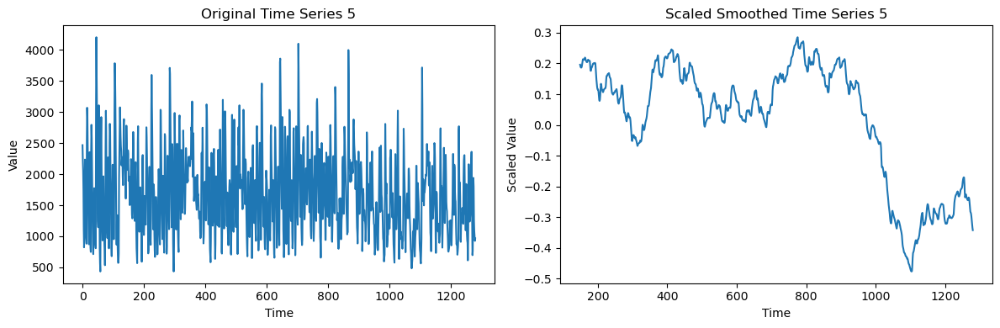

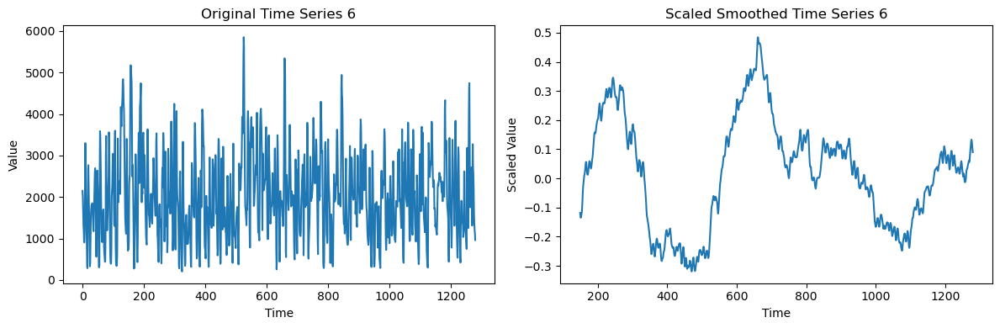

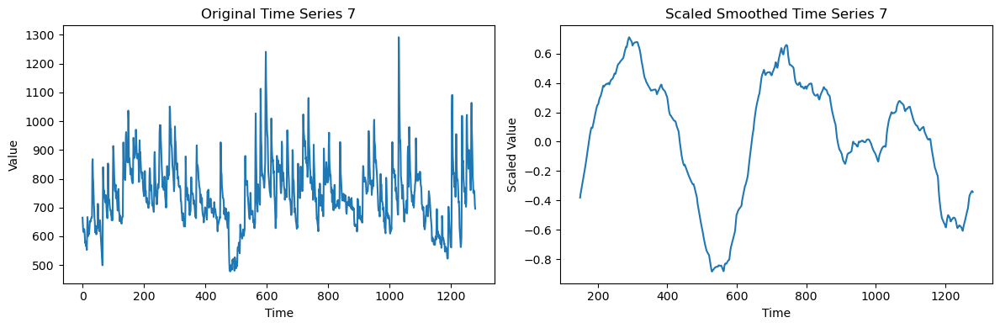

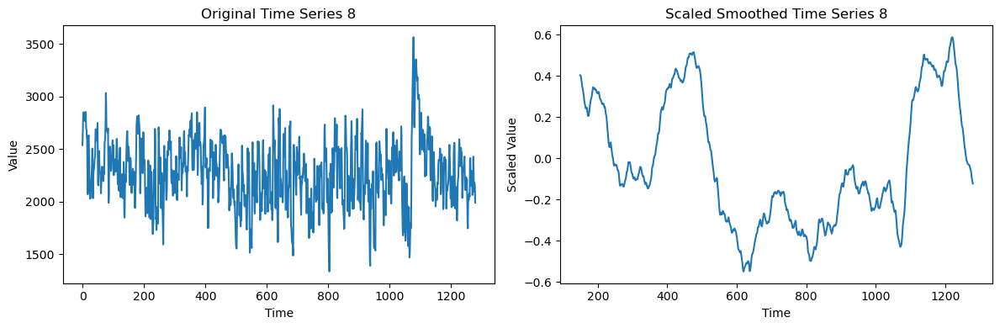

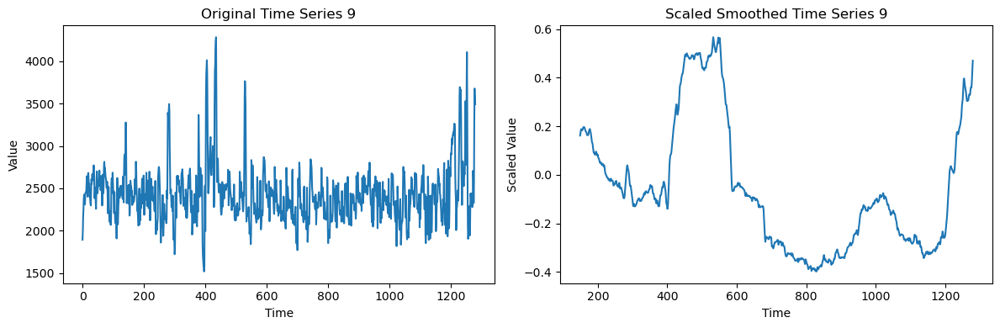

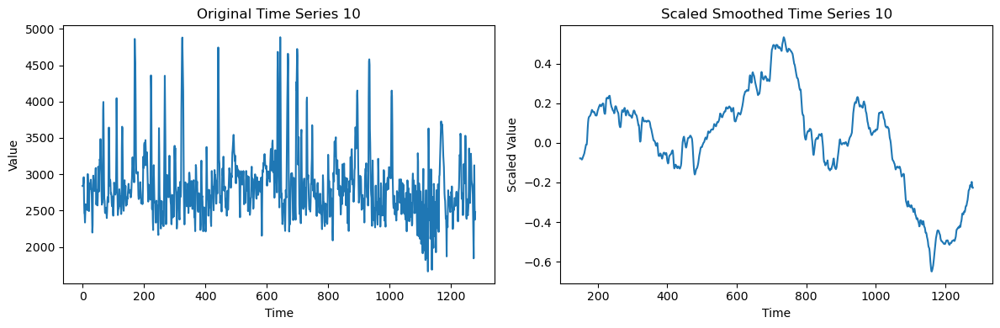

In [17]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import StandardScaler

# Define window size for rolling mean
w = 150

# Assume X contains the time series data for the first 10 time series
scaler = StandardScaler()

for i in range(10):
    ts = X_sampled[i][0]  # Assuming X is a list of lists where each inner list contains a single time series
    
    # Scale the time series
    tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))
    
    # Mean centering and standardization
    ts_scaled = ((tss - tss.mean()) / tss.std())
    
    # Apply rolling window mean
    ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w).mean()
    
    # Plot comparison subplot
    plt.figure(figsize=(12, 4))
    
    # Plot original time series
    plt.subplot(1, 2, 1)
    plt.plot(ts)
    plt.xlabel("Time")
    plt.ylabel("Value")
    plt.title(f"Original Time Series {i+1}")
    
    # Plot scaled and smoothed time series
    plt.subplot(1, 2, 2)
    plt.plot(ts_smoothed)
    plt.xlabel("Time")
    plt.ylabel("Scaled Value")
    plt.title(f"Scaled Smoothed Time Series {i+1}")
    
    plt.tight_layout()
    plt.show()


In [18]:
from sktime.transformations.panel.dictionary_based import PAA

# Reconstruct Error on PAA approx

In [19]:
from sklearn.metrics import pairwise_distances
from sklearn.preprocessing import StandardScaler

# Define your time series data in X

# Define window size for rolling mean
w_values = [5, 10, 100, 150, 180, 250]

original_series_list = []
scaled_series_list = []
smoothed_series_list = []
euclidean_distance_list = []

min_distance = float('inf')  # Initialize min_distance with infinity
best_w = None

for w in w_values:
    scaled_series_per_w = []  # List to store scaled series for the current window size
    smoothed_series_per_w = []  # List to store smoothed series for the current window size
    original_series_per_w = []  # List to store reconstructed series for the current window size
    
    distance_sum = 0
    for i in range(len(X_sampled)):
        ts = X_sampled[i][0]  # Assuming X is a list of time series
        
        # Scale the time series
        scaler = StandardScaler()
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))
        
        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())
        
        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()
            
        # Capture noise (difference between scaled and smoothed series)
        noise = ts_scaled.squeeze() - ts_smoothed
        
        # Reconstruct the original time series by adding back the noise
        original_series = ts_smoothed + noise

        # Append the current time series to the lists for the current window size
        scaled_series_per_w.append(ts_scaled)
        smoothed_series_per_w.append(ts_smoothed)
        original_series_per_w.append(original_series)

        
        # Calculate Euclidean distance between original and smoothed time series
        distance = pairwise_distances(ts_scaled.flatten().reshape(1, -1), np.array(original_series).flatten().reshape(1, -1), metric='euclidean')
        distance_sum += distance

    # Calculate average Euclidean distance for the current window size
    avg_distance = distance_sum / len(X)
    euclidean_distance_list.append(avg_distance)
    
    # Update min_distance and best_w if the current average distance is smaller than min_distance
    if avg_distance < min_distance:
        min_distance = avg_distance
        best_w = w
        
    # Append the lists for the current window size to the main lists
    scaled_series_list.append(scaled_series_per_w)
    smoothed_series_list.append(smoothed_series_per_w)
    original_series_list.append(original_series_per_w)

# Print best window size and corresponding minimum Euclidean distance
print("Best window size:", best_w)
print("Minimum Euclidean distance:", min_distance)


Best window size: 180
Minimum Euclidean distance: [[9.01689119e-08]]


In [20]:
# Find the index of the best window size in w_values
best_w_index = w_values.index(best_w)

w = 150

# Select the lists corresponding to the best window size
best_scaled_series_list = scaled_series_list[best_w_index]
best_smoothed_series_list = smoothed_series_list[best_w_index]
best_original_series_list = original_series_list[best_w_index]

# Now you can use best_scaled_series_list, best_smoothed_series_list, and best_original_series_list
# for further analysis or visualization

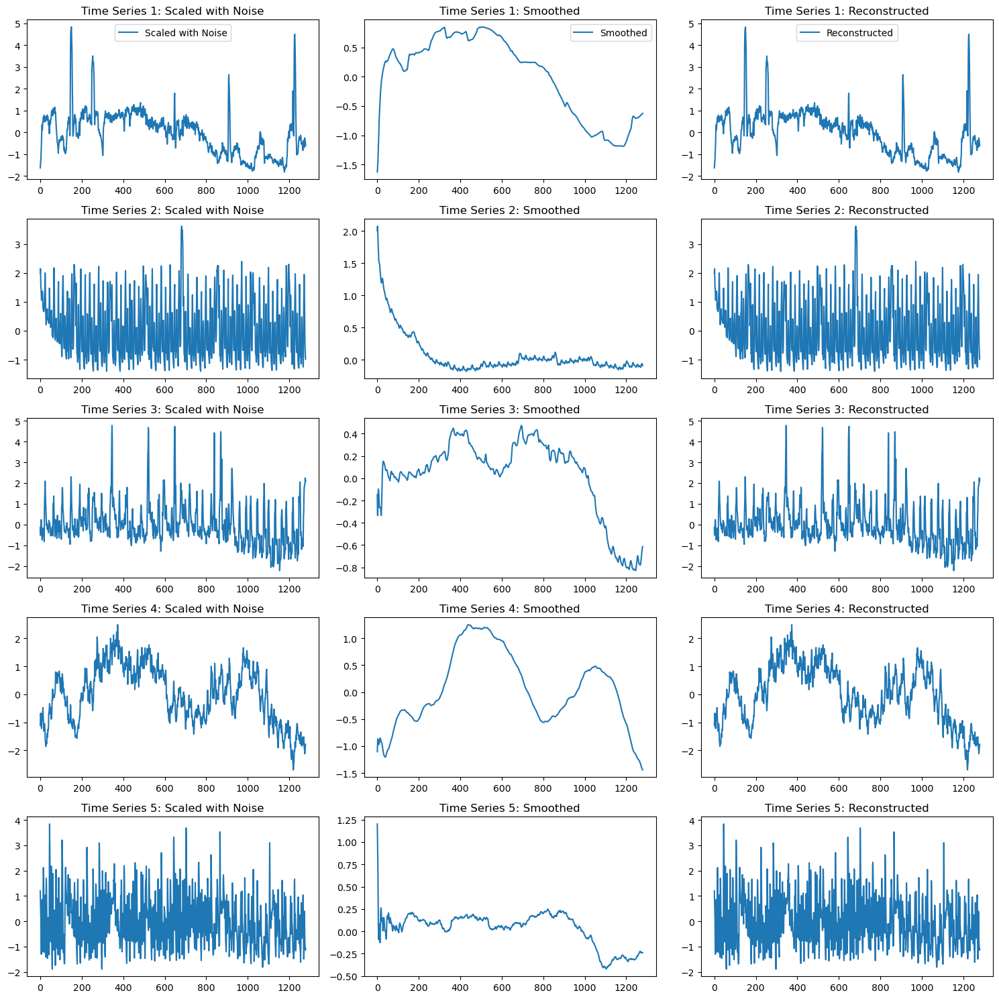

In [21]:
# Plot the scaled time series with noise and the reconstructed time series side by side
num_series_to_plot = (5)  # Plot at most 50 time series or the number available
num_plots = 3  # Three plots per time series: scaled with noise, smoothed, and reconstructed

if num_series_to_plot > 0:
    plt.figure(figsize=(15, num_series_to_plot*3))

    for i in range(num_series_to_plot):
        for j in range(num_plots):
            plt.subplot(num_series_to_plot, num_plots, i * num_plots + j + 1)
            if j == 0:
                plt.plot(best_scaled_series_list[i], label='Scaled with Noise')
                plt.title(f'Time Series {i+1}: Scaled with Noise')
            elif j == 1:
                plt.plot(best_smoothed_series_list[i], label='Smoothed')
                plt.title(f'Time Series {i+1}: Smoothed')
            else:
                plt.plot(best_original_series_list[i], label='Reconstructed')
                plt.title(f'Time Series {i+1}: Reconstructed')
            if i == 0:
                plt.legend()

    plt.tight_layout()
    plt.show()
else:
    print("No time series available for plotting.")


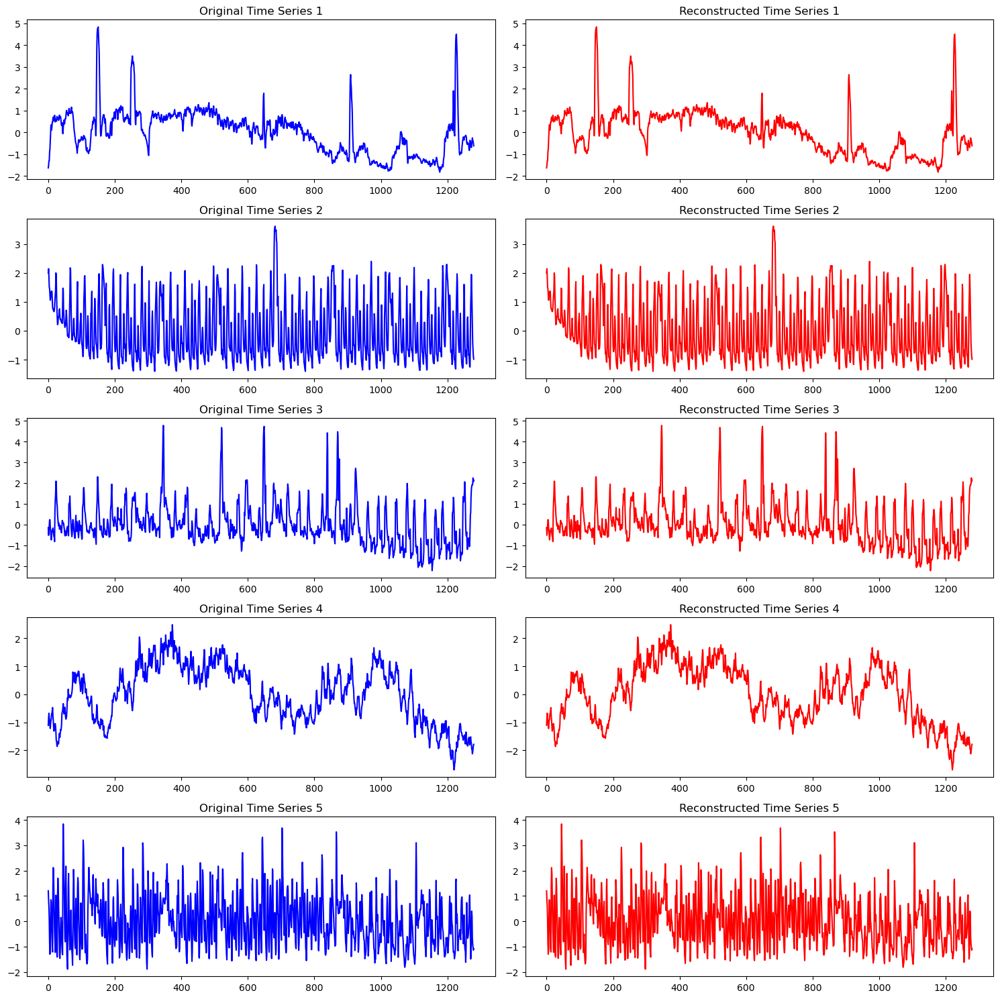

In [22]:
import matplotlib.pyplot as plt

# Assuming original_series_list contains the reconstructed original time series
# and X contains the original time series data

# Plotting the time series side by side
num_samples = 5  # Number of time series to plot

fig, axs = plt.subplots(num_samples, 2, figsize=(15, num_samples*3))

for i in range(num_samples):
    # Original time series
    axs[i, 0].plot(best_scaled_series_list[i], color='blue', label='Original')
    axs[i, 0].set_title('Original Time Series ' + str(i+1))
    
    # Reconstructed time series
    axs[i, 1].plot(best_original_series_list[i], color='red', label='Reconstructed')
    axs[i, 1].set_title('Reconstructed Time Series ' + str(i+1))

plt.tight_layout()
plt.show()


# Find best PAA intervals

The best interval value is: 160
Minimum euclidean distance: 1.057730422074065


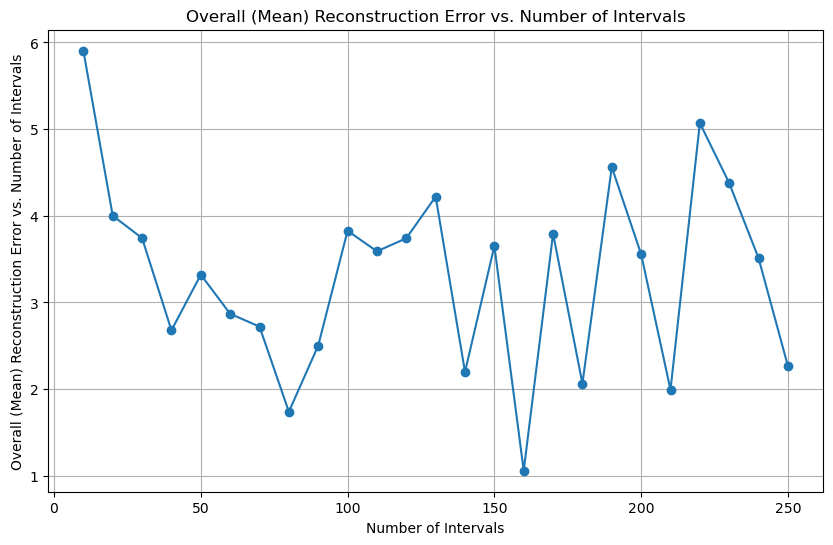

In [23]:
from tslearn.piecewise import PiecewiseAggregateApproximation
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import euclidean

# Define a function to calculate Euclidean distance
def calculate_euclidean_distance(x1, x2):
    return np.sqrt(np.sum((x1 - x2) ** 2))

# Initialize a list to store average distances for different values of num_intervals
avg_distances = []

# Initialize a list to store the distances for the best interval
distances_for_best_interval = []

# Iterate over each time series in X
for series_list in X_sampled:

    # Initialize a list to store average distances for different values of num_intervals for the current series
    avg_distances_series = []

    # Try different values of num_intervals
    for num_intervals in range(10, 251, 10):  # Try intervals from 10 to 250

        # Select the first time series
        ts = series_list[0]  # Assuming each series_list contains a single time series

        # Scale the time series
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())

        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

        # New dataframe for ts_smoothed
        df = pd.DataFrame(ts_smoothed)
        df_values = df.values.reshape(1, -1, 1)  # Reshape to 3D array (n_samples, n_timestamps, n_features)

        # Perform Piecewise Aggregate Approximation (PAA)
        paa = PiecewiseAggregateApproximation(n_segments=num_intervals)
        ts_paa = paa.fit_transform(df_values)

        # Invert PAA transformation
        inverse_paa = paa.inverse_transform(ts_paa)

        # Invert scaling transformation
        reconstructed_series = inverse_paa.squeeze()

        # Calculate Euclidean distance between smoothed and reconstructed time series
        distance = calculate_euclidean_distance(ts_smoothed, reconstructed_series)

        # Append the distance to the list
        avg_distances_series.append(distance)

    # Append the average distances for the current series to the overall list
    avg_distances.append(avg_distances_series)

# Calculate the overall average distances across all time series for each num_intervals
overall_avg_distances = np.mean(avg_distances, axis=0)

# Find the index of the minimum overall average Euclidean distance
best_interval_index = np.argmin(overall_avg_distances)

# Calculate the corresponding best num_intervals
best_interval = 10 + best_interval_index * 10  # Because the intervals start from 10 and increase by 10

# Obtain the minimum Euclidean distance
min_euclidean_distance = overall_avg_distances[best_interval_index]

# Print the best interval value and the corresponding minimum Euclidean distance
print("The best interval value is:", best_interval)
print("Minimum euclidean distance:", min_euclidean_distance)

# Plot the overall average distances for different values of num_intervals
plt.figure(figsize=(10, 6))
plt.plot(range(10, 251, 10), overall_avg_distances, marker='o', linestyle='-')
plt.title('Overall (Mean) Reconstruction Error vs. Number of Intervals')
plt.xlabel('Number of Intervals')
plt.ylabel('Overall (Mean) Reconstruction Error vs. Number of Intervals')
plt.grid(True)
plt.show()


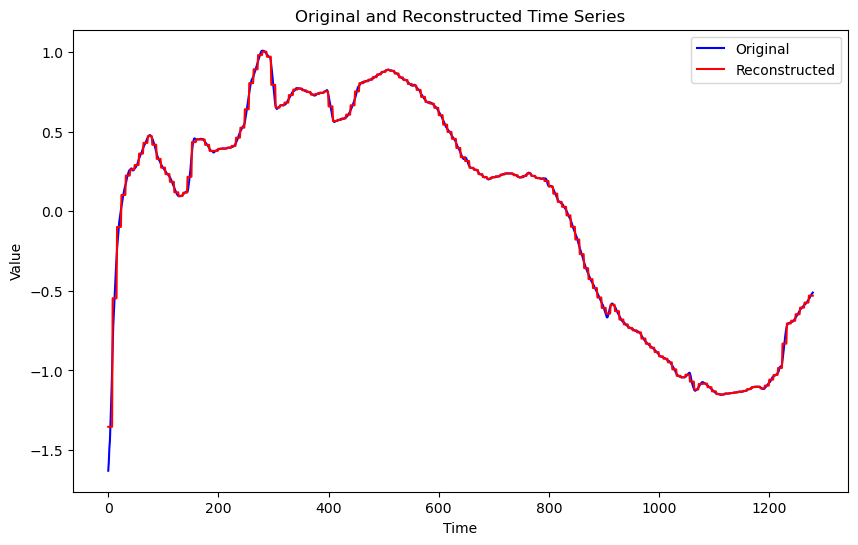

In [24]:
# Define window size for rolling mean
w = 150  # Best value from previous studies

# best value from previous studies
num_intervals = 160

# Select one time series from X
ts = X_sampled[0][0]  # Assuming X is a list of lists where each inner list contains a single time series

# Initialize scaler
scaler = StandardScaler()

# Scale the time series
tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

# Mean centering and standardization (amplitude scaling)
ts_scaled = ((tss - tss.mean()) / tss.std())

# Apply rolling window mean (noise)
ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

# New dataframe for ts_smoothed
df = pd.DataFrame(ts_smoothed)
df_values = df.values.reshape(1, -1, 1)  # Reshape to 3D array (n_samples, n_timestamps, n_features)

# Perform Piecewise Aggregate Approximation (PAA)
paa = PiecewiseAggregateApproximation(n_segments=num_intervals)
ts_paa = paa.fit_transform(df_values)

# Invert PAA transformation
inverse_paa = paa.inverse_transform(ts_paa)

# Invert scaling transformation
reconstructed_series = inverse_paa.squeeze()

# Plot original and reconstructed time series
plt.figure(figsize=(10, 6))
plt.plot(ts_smoothed, label='Original', color='blue')
plt.plot(reconstructed_series, label='Reconstructed', color='red')
plt.title('Original and Reconstructed Time Series')
plt.xlabel('Time')
plt.ylabel('Value')
plt.legend()
plt.show()


# Preprocess TS with best values so far

In [25]:
w=150 
best_intervals=160 # from past studies
ts_paa_list = []

for i in range(len(X_sampled)):
        ts = X_sampled[i][0]  # Assuming X is a list of lists where each inner list contains a single time series

        # Scale the time series
        tss = scaler.fit_transform(np.array(ts).reshape(-1, 1))

        # Mean centering and standardization (amplitude scaling)
        ts_scaled = ((tss - tss.mean()) / tss.std())

        # Apply rolling window mean (noise)
        ts_smoothed = pd.Series(ts_scaled.squeeze()).rolling(window=w, min_periods=1).mean()

        # Perform Piecewise Aggregate Approximation (PAA)
        paa = PAA(num_intervals=best_intervals)
        ts_paa = paa.fit_transform(pd.DataFrame(ts_smoothed)).iloc[:, 0].values
        ts_paa_list.append([ts_paa])

In [26]:
ts_paa

array([-1.90984771e+00, -1.35121918e+00, -1.06456067e+00, -1.11018522e+00,
       -3.94244728e-01,  2.32484812e-01,  1.77569741e-01,  1.90716008e-02,
       -4.99760653e-02, -3.56589968e-02,  1.26080739e-01,  9.40462844e-02,
        4.30409100e-02, -1.61580566e-02, -1.20963045e-02,  4.34967154e-02,
        1.92321695e-01,  1.76859916e-01,  1.41035914e-01,  1.95675828e-01,
        1.99052866e-01,  2.28187674e-01,  3.03157291e-01,  1.37000824e-01,
        6.95775655e-02,  1.50897966e-01,  2.51903152e-01,  2.41605178e-01,
        1.67674203e-01,  6.11092346e-02,  2.16633206e-02,  1.09668358e-02,
        3.56314238e-02, -1.62581579e-02, -8.64790669e-02, -1.44233790e-01,
       -5.47713937e-02,  2.65113114e-02,  5.73249012e-02,  1.36928188e-01,
        9.87563490e-02,  2.12965952e-02, -3.69479929e-02, -1.14485445e-01,
       -1.64001972e-01, -1.20841601e-01, -6.51966338e-02, -5.10525485e-02,
        1.22651797e-02,  8.57678265e-02,  1.23705806e-01,  1.60371467e-01,
        2.02493717e-01,  

In [27]:
ts_paa_vect = np.array(ts_paa_list)

In [28]:
ts_paa_vect.shape

(2000, 1, 160)

In [29]:
# salva serie temporali normalizzate
#salvo i valori ottenuti
import numpy as np
import pandas as pd

# Assume che X, y e ids siano già definiti

# Salva i numpy array separatamente
np.save('X_finale_normalizzato_100.npy', ts_paa_vect)
np.save('y_finale_normalizzato_100.npy', y_sampled)
np.save('ids_finale_normalizzato_100.npy', ids_sampled)



## Motifs

In [3]:
# salva serie temporali normalizzate
#salvo i valori ottenuti
import numpy as np
import pandas as pd

# Assume che X, y e ids siano già definiti

# Salva i numpy array separatamente
ts_paa_vect=np.load('X_finale_normalizzato_100.npy')
y_sampled=np.load('y_finale_normalizzato_100.npy')
ids_sampled=np.load('ids_finale_normalizzato_100.npy')



In [4]:
y_sampled

array(['opera', 'minimal-techno', 'goth', ..., 'salsa', 'salsa',
       'songwriter'], dtype='<U17')

In [5]:
ts_paa_vect.shape

(2000, 1, 160)

In [6]:
from matrixprofile import *

In [7]:
# estrai gli indici
motifs_list = []

for i in range(ts_paa_vect.shape[0]):
    # Seleziona la serie temporale corrente
    ts_values = ts_paa_vect[i, 0, :]
    
    # Calcola la larghezza della finestra
    w = 5
    # Verifica se la lunghezza della serie temporale è sufficiente per calcolare la Matrix Profile
    #if len(ts_values) >= w:
        # Calcola la Matrix Profile per la serie temporale corrente
    mp, mpi = matrixProfile.stomp(ts_values, w)
        
        # Estrai i motifs dalla Matrix Profile
    mo, mod = motifs.motifs(ts_values, (mp, mpi), max_motifs=3)  # Estrarre i primi 3 motifs
        
        # Aggiungi gli indici alla lista
    motifs_list.append(mo)

# Ora motifs_list contiene i motifs per ogni serie temporale che ha una lunghezza sufficiente per calcolare la Matrix Profile


In [8]:
len(motifs_list)

2000

In [9]:
motifs_list

[[[107, 120], [98, 102, 125]],
 [[78, 121], [114, 126]],
 [[31, 73, 85], [136, 140], [92, 122, 143]],
 [[84, 143], [5, 35, 104], [76, 147]],
 [[81, 103], [96, 111]],
 [[69, 73, 144], [41, 54]],
 [[16, 71, 77], [55, 60]],
 [[27, 91, 154], [47, 80, 135]],
 [[27, 77, 132], [23, 68], [102, 143]],
 [[45, 97], [62, 67, 76]],
 [[6, 48], [83, 97], [56, 66]],
 [[59, 103], [36, 69], [79, 148]],
 [[92, 96], [134, 139], [64, 128]],
 [[14, 79, 125], [89, 98], [65, 137]],
 [[12, 16, 142], [64, 80], [25, 37]],
 [[79, 82], [15, 60, 110], [96, 150]],
 [[20, 73], [15, 115]],
 [[114, 129], [22, 59], [15, 42]],
 [[47, 70], [86, 155], [42, 145]],
 [[19, 57], [138, 150]],
 [[10, 115], [65, 135], [29, 41]],
 [[11, 127], [55, 142, 150]],
 [[0, 37], [40, 53, 123]],
 [[120, 153]],
 [[7, 87], [124, 128], [35, 90, 144]],
 [[71, 94], [28, 147], [44, 51]],
 [[42, 138], [6, 11, 92], [86, 153]],
 [[128, 145], [7, 59, 131], [50, 104]],
 [[61, 135], [86, 89, 116], [120, 155]],
 [[149, 152], [106, 112], [72, 134]],
 [[5

In [10]:
import numpy as np

# Lista per salvare le sotto-sequenze dei motifs
motif = []

# Numero massimo di motifs da estrarre per ogni serie temporale
max_motifs_per_timeseries = 3

for motifs_indices in motifs_list:
    motif_sequence = []  # Inizializza una nuova sequenza di motif
    # Estrai fino ai primi 3 motifs di ogni serie temporale
    for motif_indices in motifs_indices[:max_motifs_per_timeseries]:
        motif_subsequence = []  # Inizializza una nuova sotto-sequenza di motif per ogni indice di motif
        for index in motif_indices:
            motif_subsequence.append(ts_values[index:index + w])  # Estrai la sotto-sequenza per ogni indice di motif
        # Aggiungi la sotto-sequenza di motif alla sequenza di motif
        motif_sequence.extend(motif_subsequence)
    
    # Aggiungi zeri per i motifs mancanti se la serie temporale non contiene 3 motifs
    while len(motif_sequence) < max_motifs_per_timeseries * w:
        motif_sequence.append(np.zeros(w))  # Aggiungi una sequenza vuota di lunghezza w
    
    # Riduci la lunghezza della sequenza di motif a 3 se contiene più di 3 motifs
    motif_sequence = motif_sequence[:max_motifs_per_timeseries]
    
    # Aggiungi la sequenza di motif alla lista di motif
    motif.append(motif_sequence)

# Trasforma la lista di motifs in un array numpy
motif_array = np.array(motif)


In [11]:
len(motif_array )

2000

In [12]:
motif_array

array([[[-0.03890035, -0.02828076, -0.06862795, -0.12168464,
         -0.08872918],
        [ 0.01099608,  0.04065978,  0.02311226, -0.03355336,
         -0.01463906],
        [-0.04483924, -0.03251452, -0.06937346, -0.0514772 ,
         -0.05464263]],

       [[-0.10017519, -0.01576149,  0.01125294,  0.05084019,
          0.04829519],
        [ 0.04065978,  0.02311226, -0.03355336, -0.01463906,
          0.00717121],
        [-0.0619147 , -0.0403467 ,  0.00465438, -0.00907032,
          0.00536317]],

       [[ 0.01096684,  0.03563142, -0.01625816, -0.08647907,
         -0.14423379],
        [-0.33384571, -0.30267754, -0.25588455, -0.18861571,
         -0.15021012],
        [ 0.00108873,  0.04200589,  0.01792311,  0.03403233,
          0.01612536]],

       ...,

       [[-0.04997607, -0.035659  ,  0.12608074,  0.09404628,
          0.04304091],
        [ 0.19905287,  0.22818767,  0.30315729,  0.13700082,
          0.06957757],
        [ 0.06957757,  0.15089797,  0.25190315,  0.241605

In [13]:
# Lista per salvare i primi elementi di ogni motivo interno
first_elements = []

# Itera su ogni sottolista di motif_array
for sub_list in motif_array:
    # Lista per salvare i primi elementi di ogni motivo interno per la sottolista corrente
    sub_first_elements = []
    
    # Itera su ogni motivo interno nella sottolista corrente
    for motif_internal in sub_list:
        # Aggiungi il primo elemento del motivo interno alla lista
        sub_first_elements.append(motif_internal[0])
    
    # Aggiungi la lista dei primi elementi dei motivi interni alla lista principale
    first_elements.append(sub_first_elements)

In [14]:
# Stampa l'array risultante
len(first_elements)

2000

In [15]:
motif_array[0]

array([[-0.03890035, -0.02828076, -0.06862795, -0.12168464, -0.08872918],
       [ 0.01099608,  0.04065978,  0.02311226, -0.03355336, -0.01463906],
       [-0.04483924, -0.03251452, -0.06937346, -0.0514772 , -0.05464263]])

In [16]:
first_elements[0]

[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696]

## Grafico

In [44]:
# Inizializza una lista vuota per memorizzare le serie temporali estratte
ts_values_list = []

# Estrai le serie temporali dalla matrice time_series_data e aggiungile a ts_values_list
for ts_values in ts_paa_vect:
    ts_values_list.append(ts_values)


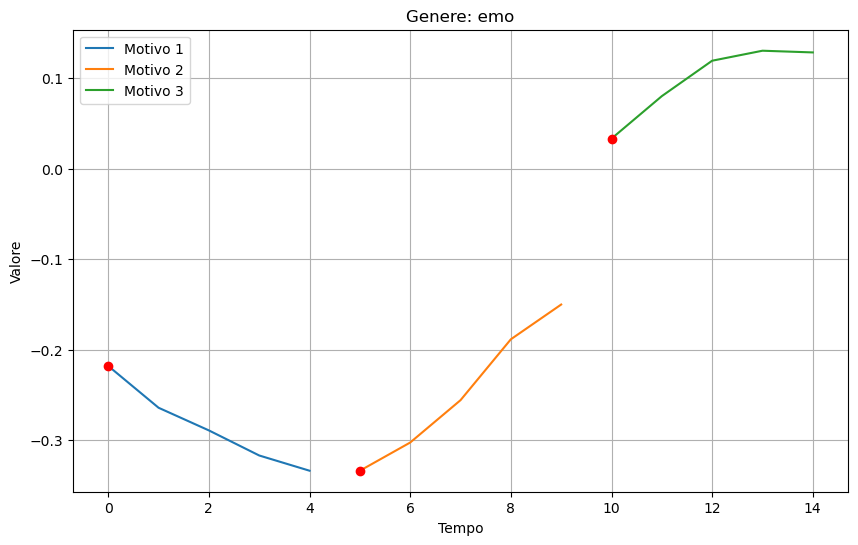

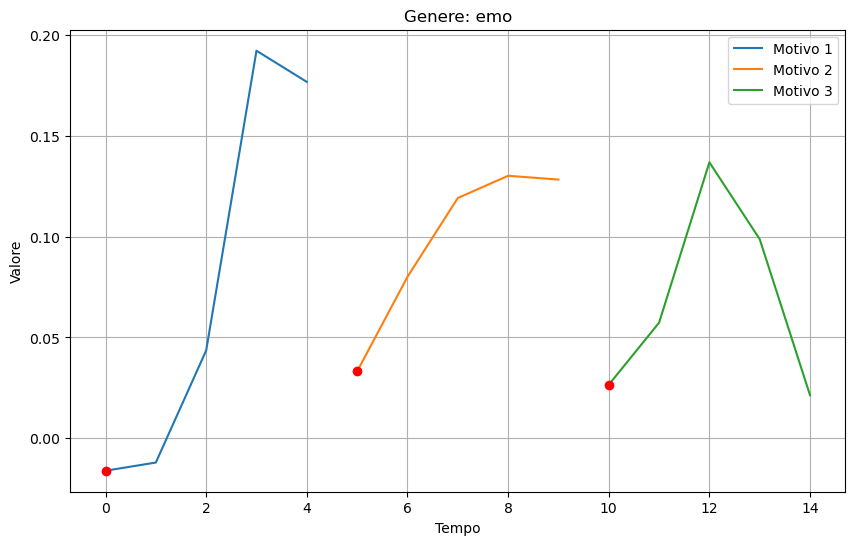

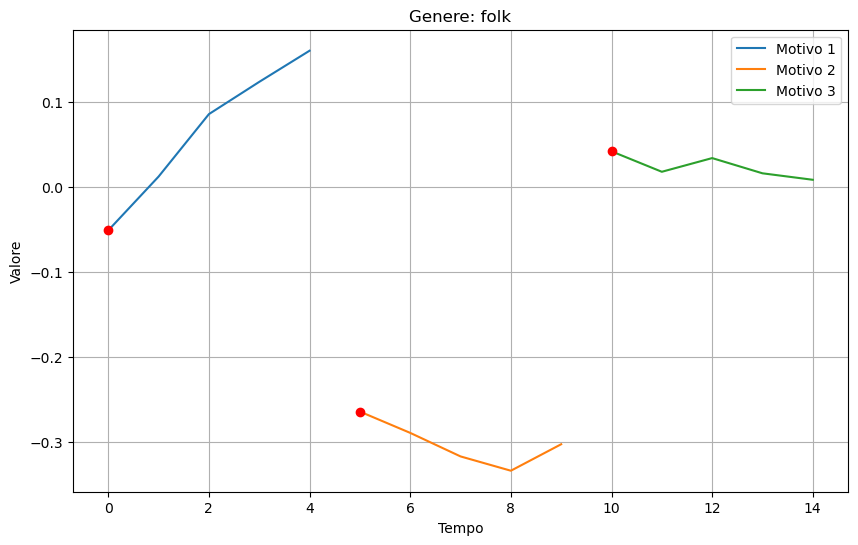

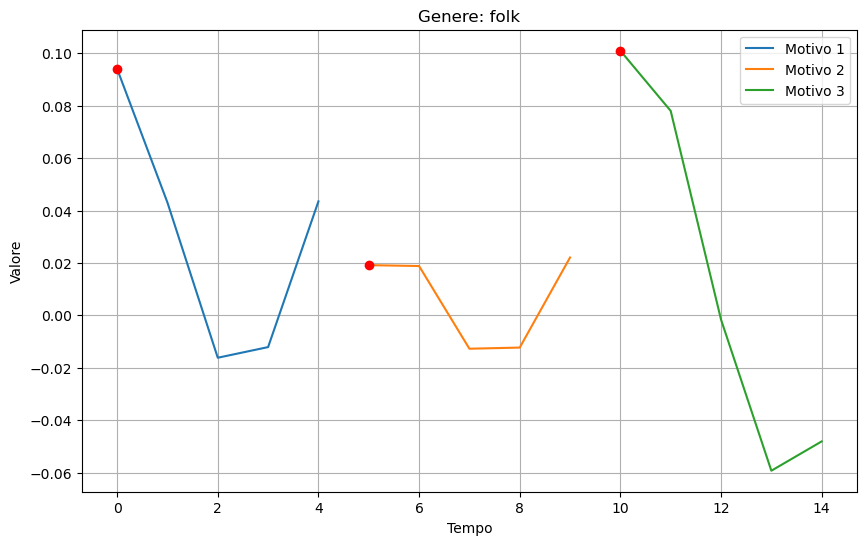

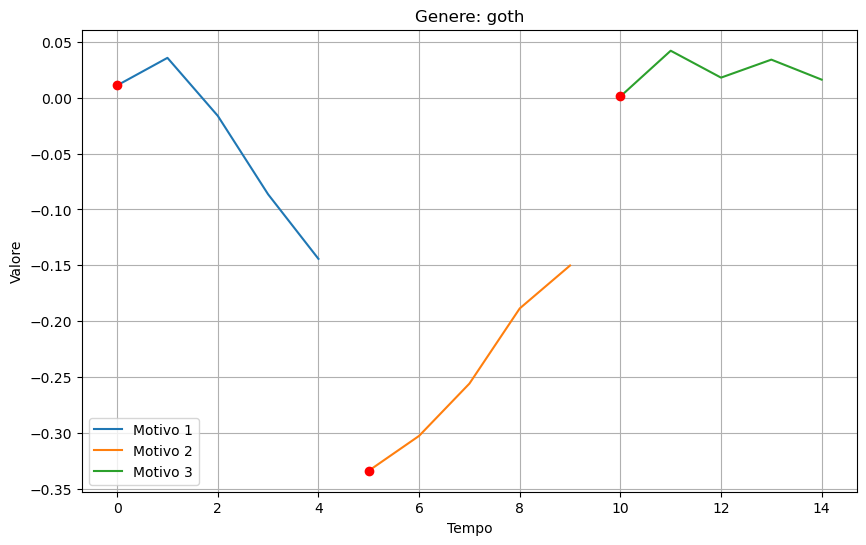

...

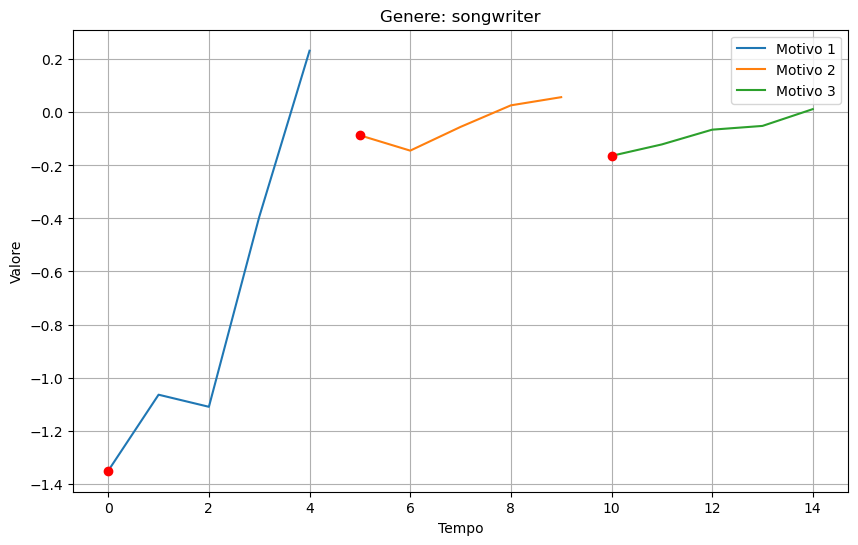

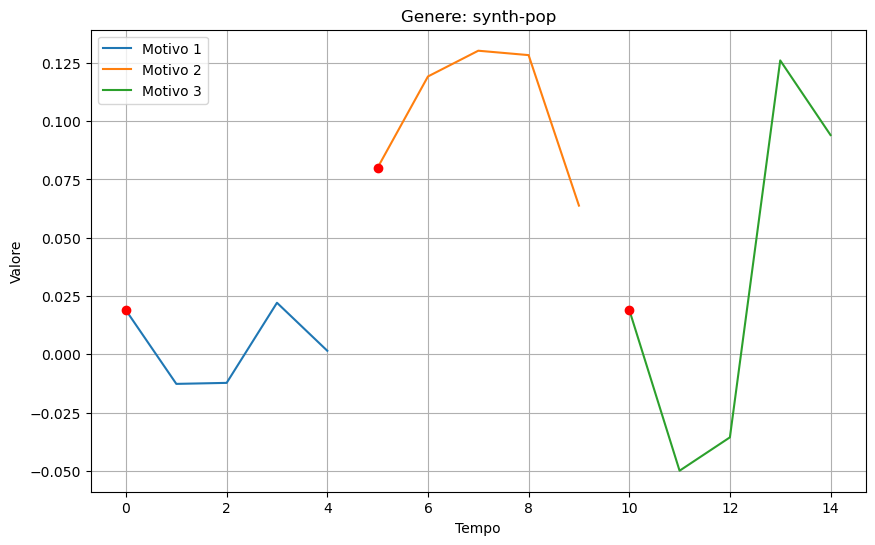

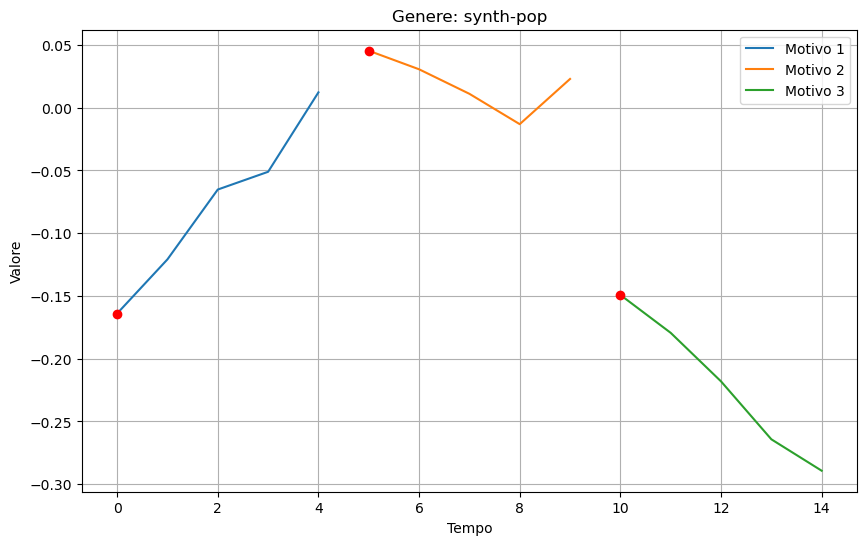

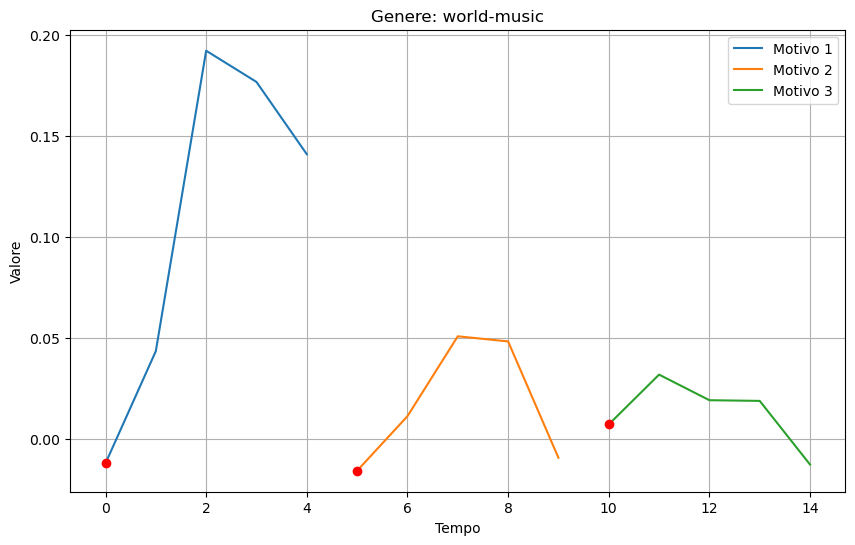

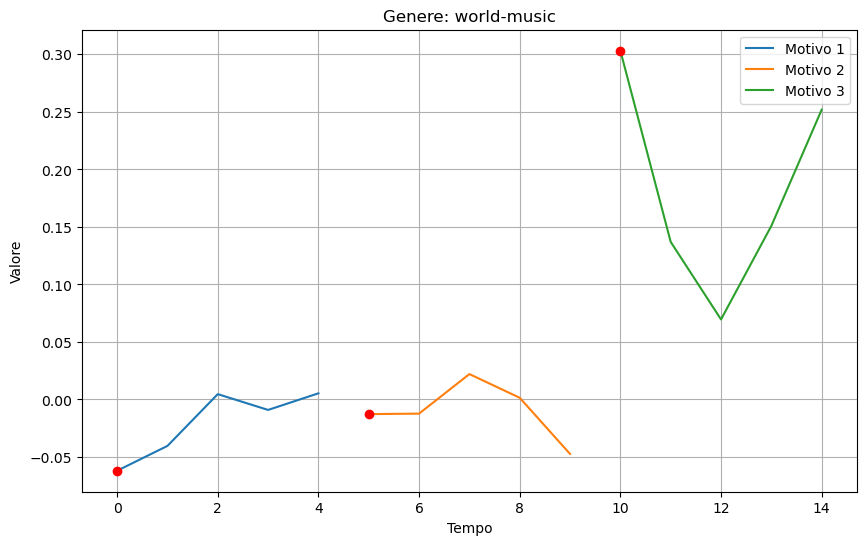

In [48]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 2

# Iteriamo su ogni genere
for genere in generi_unici:
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


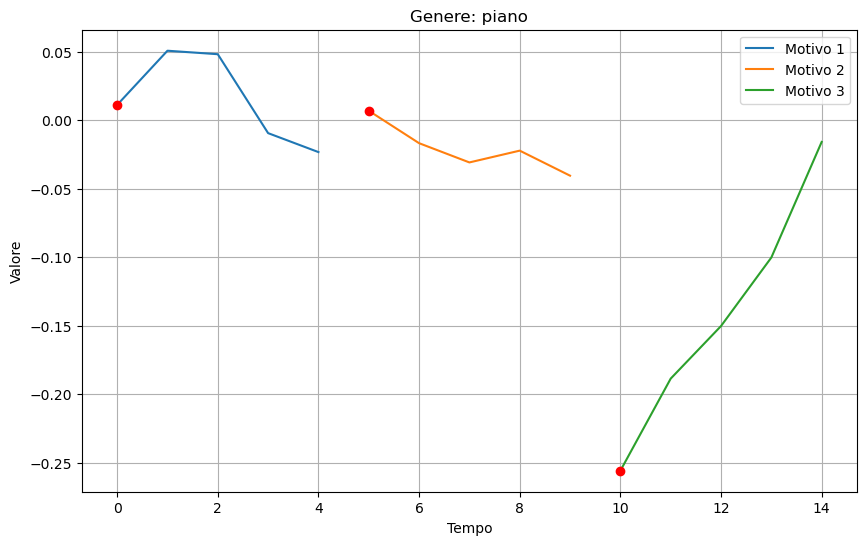

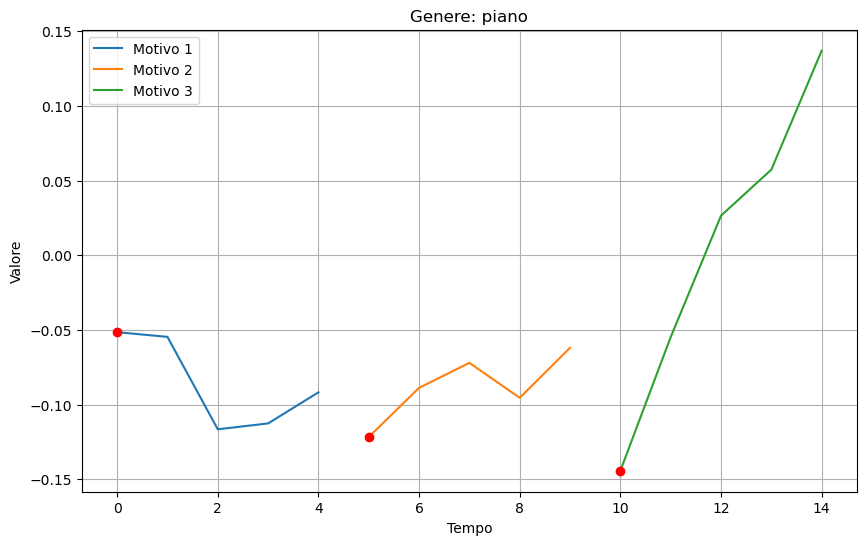

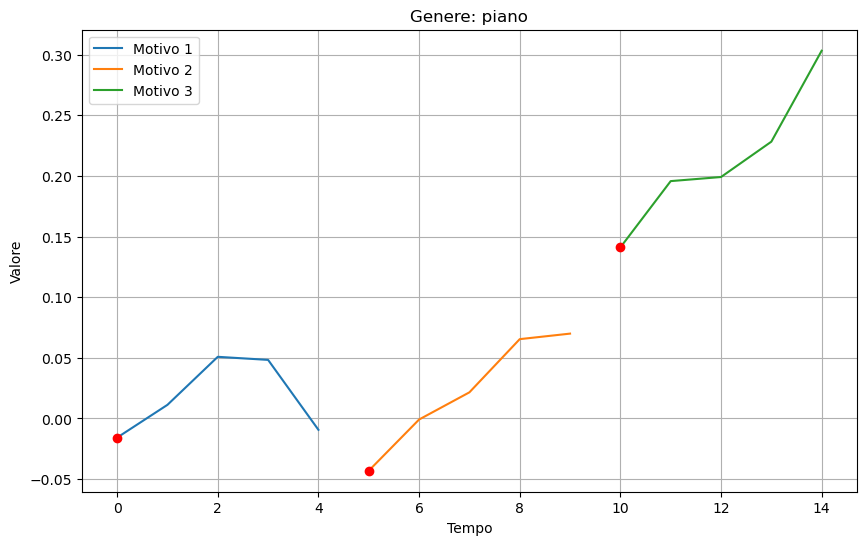

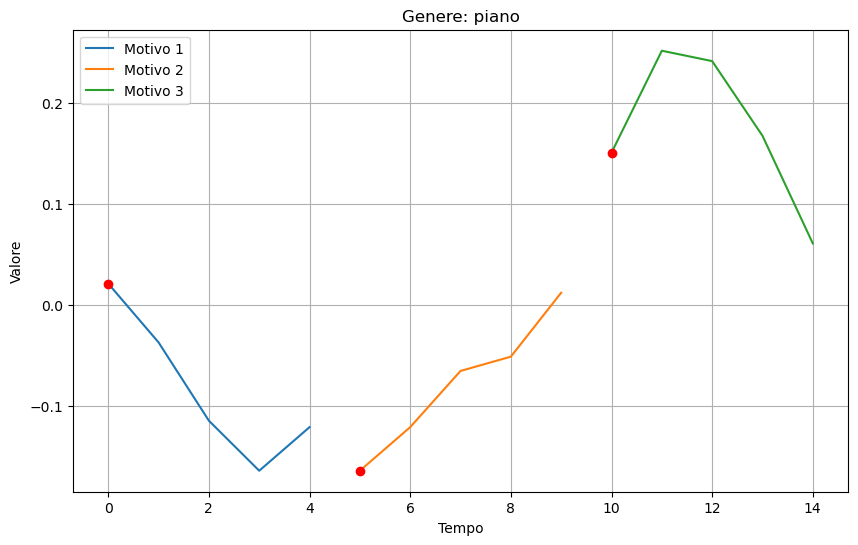

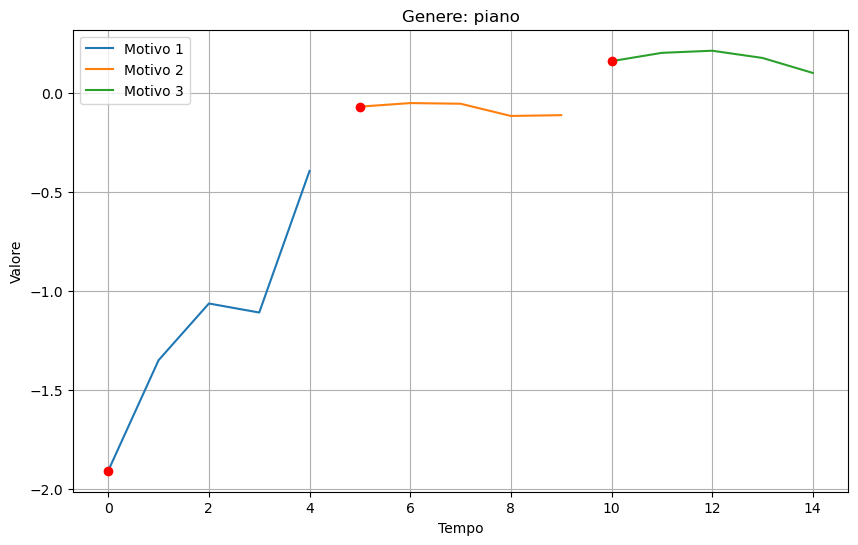

...

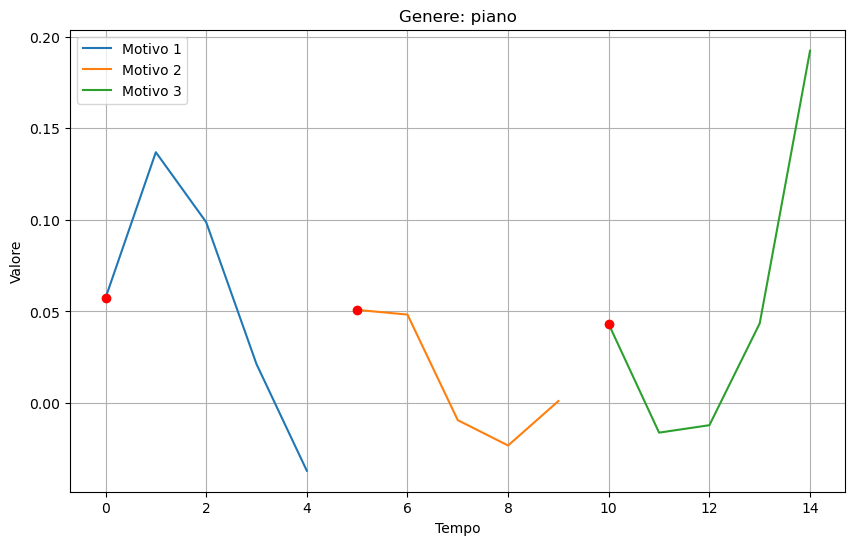

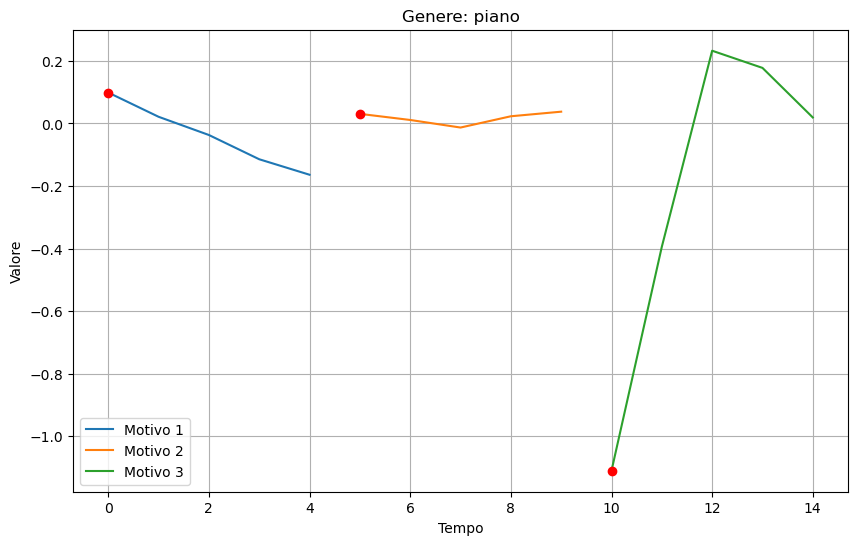

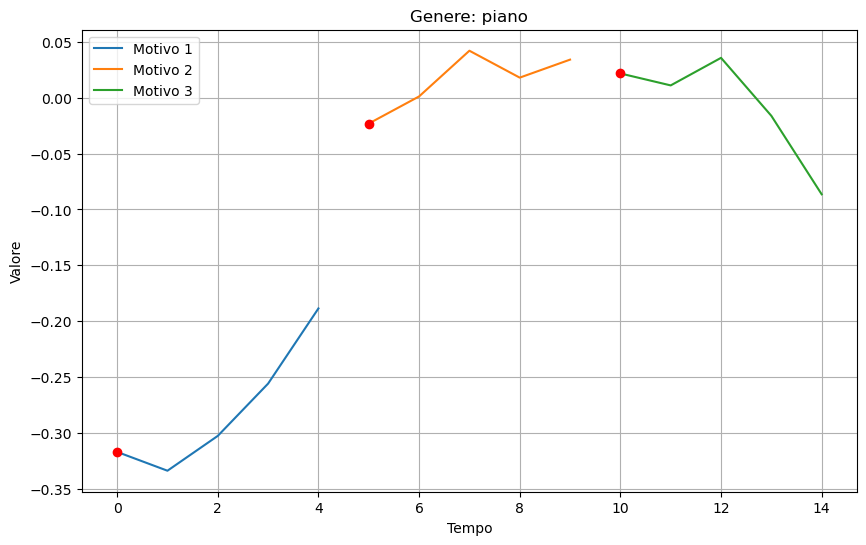

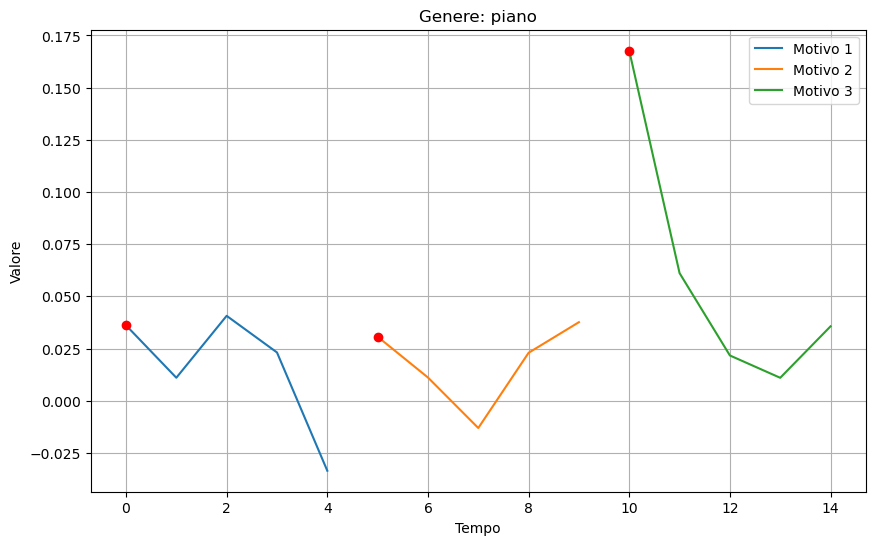

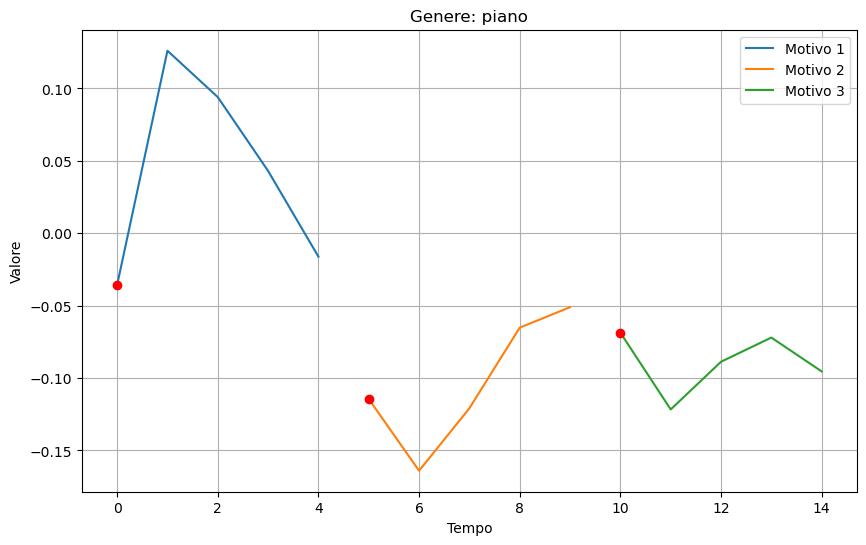

In [55]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Genere selezionato
genere_selezionato = "piano"

# Trova gli indici delle serie temporali appartenenti al genere selezionato
indici_genere_selezionato = np.where(y_sampled == genere_selezionato)[0]

# Se non ci sono serie temporali per il genere selezionato, esci
if len(indici_genere_selezionato) == 0:
    print(f"Nessuna serie temporale trovata per il genere {genere_selezionato}")
    exit()

# Iteriamo su ogni serie temporale per il genere selezionato
for indice_serie in indici_genere_selezionato:
    # Nome del genere
    nome_genere = f'Genere: {genere_selezionato}'
    
    # Serie temporale corrente
    serie_temporale = motif_array[indice_serie]
    
    # Primi elementi dei motivi interni
    primi_elementi_motivi = first_elements[indice_serie]
    
    # Creazione del grafico
    plt.figure(figsize=(10, 6))
    
    # Grano in cima con il nome del genere
    plt.title(nome_genere)
    
    # Serie temporale con i motivi rappresentati
    for i, motivo in enumerate(serie_temporale):
        plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
        plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
    
    # Impostazioni aggiuntive del grafico
    plt.xlabel('Tempo')
    plt.ylabel('Valore')
    plt.legend()
    plt.grid(True)
    plt.show()


In [17]:
df_motif={'Motif': first_elements,
        'Genres': y_sampled,
         'ids': ids_sampled}
df_motif=pd.DataFrame(df_motif)

In [18]:
df_motif

,Motif,Genres,ids
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw
...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768


In [18]:
type(first_elements)

list

## Clustering Motif

## PCA

In [45]:
from sklearn.decomposition import PCA
# Esegui la PCA per ridurre le dimensioni
pca = PCA(n_components=2)
X_pca = pca.fit_transform(first_elements)

In [46]:
X_pca

array([[-0.00131535, -0.00315262],
       [-0.02618938,  0.05532206],
       [-0.0087642 , -0.07124888],
       ...,
       [-0.09576785, -0.06603554],
       [-0.05587469,  0.08797733],
       [ 0.0404497 , -0.12927917]])

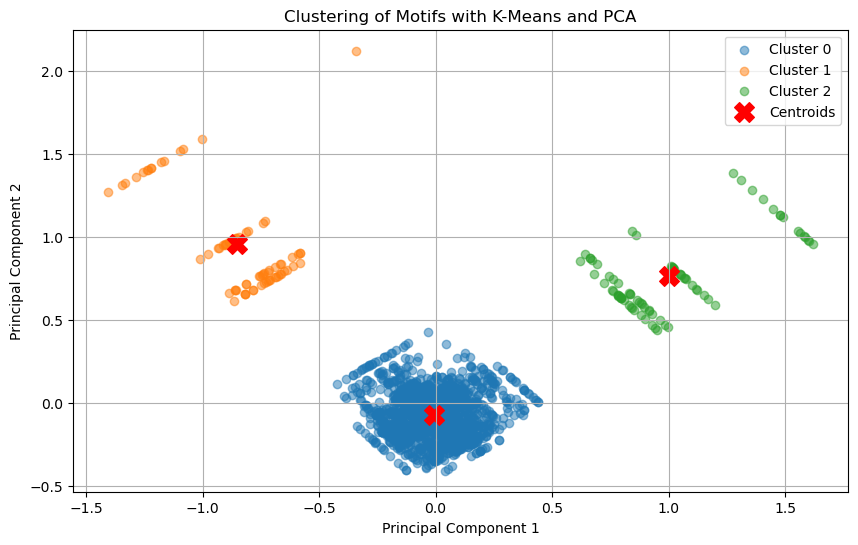

In [48]:
from sklearn.cluster import KMeans
# Esegui il clustering con K-Means sui componenti PCA
kmeans = KMeans(n_clusters=3, random_state=94)
kmeans.fit(X_pca)

# Ottieni le etichette dei cluster assegnate
cluster_labels = kmeans.labels_

# Plot dei risultati
plt.figure(figsize=(10, 6))
for cluster in range(3):
    motifs = X_pca[cluster_labels == cluster]  # Seleziona i motifs appartenenti al cluster corrente
    plt.scatter(motifs[:, 0], motifs[:, 1], label=f'Cluster {cluster}', alpha=0.5)

# Plot dei centroidi
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='X', s=200, c='red', label='Centroids')

plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Clustering of Motifs with K-Means and PCA')
plt.legend()
plt.grid(True)
plt.show()

In [49]:
df_motif

,Motif,Genres,ids
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw
...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768


In [50]:
df_motif['Cluster_Label']=kmeans.labels_

In [51]:
df_motif['Cluster_Label'] = df_motif['Cluster_Label'].map({0:"A", 1: "B", 2: "C"})

In [52]:
df_motif

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,A
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,A
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


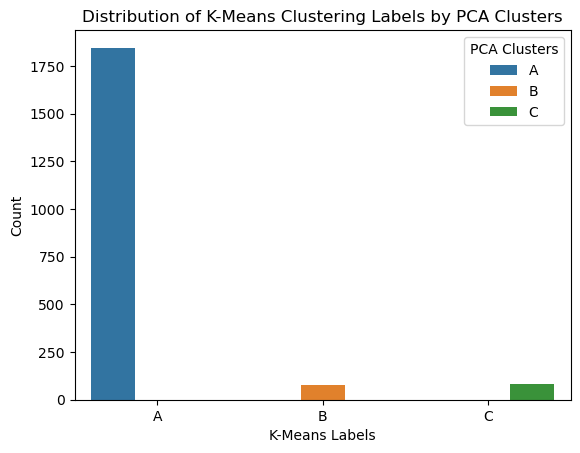

In [53]:
import seaborn as sns

# Plot della distribuzione dei cluster assegnati dalla PCA
sns.countplot(data=df_motif, x='Cluster_Label', hue='Cluster_Label')
plt.xlabel('K-Means Labels')
plt.ylabel('Count')
plt.title('Distribution of K-Means Clustering Labels by PCA Clusters')
plt.legend(title='PCA Clusters')
plt.show()


In [54]:
df_motif.columns

Index(['Motif', 'Genres', 'ids', 'Cluster_Label'], dtype='object')

In [55]:
centroids = kmeans.cluster_centers_
print("Centroidi dei cluster:")
print(centroids)

Centroidi dei cluster:
[[-0.00889209 -0.07189751]
 [-0.85096163  0.95542936]
 [ 1.00285042  0.76242132]]


## Merge 

In [56]:
dataset=pd.read_csv('nuovo_dataset_totale.csv')

In [57]:
dataset

,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,album_type,album_name,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,4rjA5kJJWbwU1prXCvg6Fk,Grey,1.0,290.48,False,52.0,5.0,Kölsch,album,1989,...,0.24,186.00,3.0,0.02,1.00,0.50,0.52,234.0,minimal-techno,[51.0]
1,6xzpUzzIquIyUzTLbbgSdI,Thrown,1.0,539.23,False,45.0,5.0,Kiasmos,album,Kiasmos,...,0.14,120.02,4.0,0.68,0.33,0.41,0.59,269.0,minimal-techno,[47.0]
2,56tXgHlSHCfgmGhwVXNizc,Routine,1.0,264.20,False,39.0,5.0,Joris Delacroix,album,Night Visions,...,0.32,118.05,3.0,0.85,0.46,0.90,0.76,171.0,minimal-techno,[44.0]
3,0s3wIBczp6TdSJ2y8cveJl,Confronted - Anfisa Letyago Stranger Remix,1.0,387.41,False,0.0,6.0,Pan-Pot;Anfisa Letyago,single,Confronted Remixes,...,0.04,128.99,4.0,0.88,0.50,0.51,0.50,207.0,minimal-techno,"[36.0, 40.0]"
4,4PSbDDd1LRYMhqPXvza6I2,Jupiter Sunrise,1.0,248.96,False,0.0,1.0,Kollektiv Turmstrasse,compilation,10 Years Diynamic,...,0.12,120.00,4.0,0.88,1.00,0.47,0.46,123.0,minimal-techno,[45.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109144,0wiDjWz3U1WfwXSrWHXe2b,I'm Good (Blue) - REAPER Extended Remix,1.0,209.66,True,23.0,2.0,David Guetta;Bebe Rexha;REAPER,single,I'm Good (Blue) [REAPER Remix],...,0.37,173.96,4.0,0.73,1.00,0.09,0.18,145.0,edm,"[86.0, 79.0, 50.0]"
109145,46n9OJc7LOIVdj8t2l5WA5,End Of The Night,1.0,205.72,True,56.0,1.0,Danny Avila,single,End Of The Night,...,0.31,99.97,4.0,0.71,1.00,0.40,0.54,84.0,edm,[47.0]
109146,127uq83uGFapbddqiMUKky,Sexy Bitch (feat. Akon),1.0,195.85,True,80.0,3.0,David Guetta;Akon,album,One More Love,...,0.80,130.01,4.0,0.81,0.99,0.10,0.33,106.0,edm,"[86.0, 79.0]"
109147,0ZdUHFxifUJNqo7G4aJzoF,Savannah,1.0,208.70,False,60.0,1.0,Diviners;Philly K.,single,Savannah,...,0.39,108.07,4.0,0.65,1.00,0.55,0.60,89.0,edm,"[47.0, 38.0]"


In [58]:
dataset_merged_after_c = pd.merge(df_motif, dataset, left_on=['ids', 'Genres'], right_on=['id', 'genre'], how='inner')

In [59]:
dataset_merged_after_c=dataset_merged_after_c.drop(['ids', 'Genres'], axis=1)

In [60]:
dataset_merged_after_c

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",A,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",A,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


In [61]:
dataset_merged_after_c['valence']

0       0.11
1       0.18
2       0.30
3       0.07
4       0.65
        ... 
1995    0.29
1996    0.92
1997    0.75
1998    0.76
1999    0.38
Name: valence, Length: 2000, dtype: float64

In [62]:
dataset_merged_after_c['Motif'].tolist()

[[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696],
 [-0.10017519152907285, 0.040659776628233564, -0.06191469653133186],
 [0.010966835784340198, -0.3338457138023082, 0.001088733910758793],
 [-0.02318040021042633, 0.0013248255658865286, 0.23248481166178803],
 [0.050840185570961455, -0.11649967694109602, -0.022132684604599603],
 [-0.2181040490337499, -0.3338457138023082, 0.03313188243560628],
 [0.19232169535512794, -0.28931324425519145, -0.15021012143150622],
 [0.24160517772080184, 0.08659714205090542, 0.045448131390106936],
 [0.24160517772080184, -0.15021012143150622, 0.0014925840628656952],
 [-0.12084160075464619, -0.04041042988183319, -0.09272366725537612],
 [0.177569741094804, 0.012265179686463816, -0.00934486145391183],
 [-0.048078031363184115, -0.11649967694109602, -0.05477139374163009],
 [0.05723904670724786, -0.022132684604599603, -0.046891652033747615],
 [-0.012096304455615622, -0.01576149177678871, 0.007171209758129033],
 [0.04304090998243482, 0.19232169535512

In [63]:
dataset_merged_after_c.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [64]:
dataset_merged_after_c

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",A,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",A,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


## Analisi 

In [66]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_A_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_A = cluster_A_data['genre'].value_counts()

print(frequenza_generi_cluster_A)


progressive-house    97
new-age              96
salsa                95
goth                 94
songwriter           94
happy                94
folk                 93
opera                92
synth-pop            92
j-idol               92
piano                92
minimal-techno       91
world-music          91
heavy-metal          91
emo                  91
honky-tonk           91
kids                 90
sertanejo            90
mpb                  90
sleep                89
Name: genre, dtype: int64


In [72]:
frequenza_generi_cluster_A[:6]

progressive-house    97
new-age              96
salsa                95
goth                 94
songwriter           94
happy                94
Name: genre, dtype: int64

## Grafici di comparazione

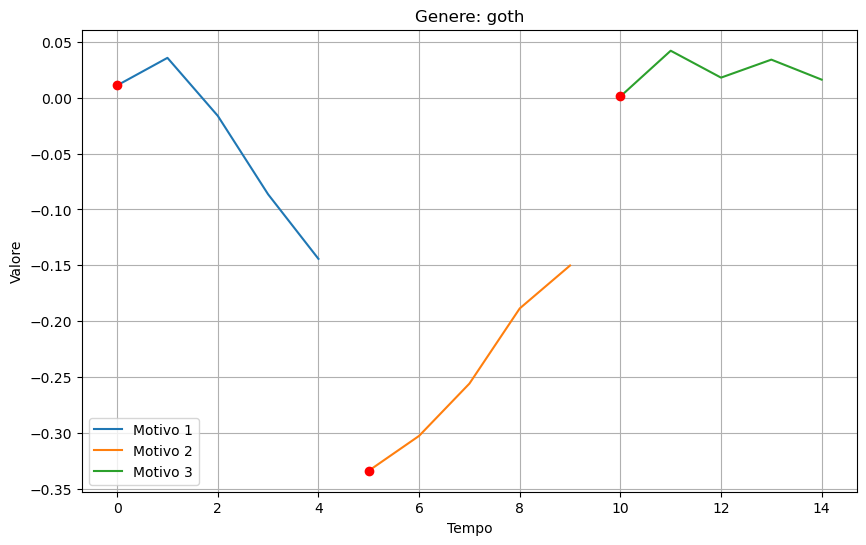

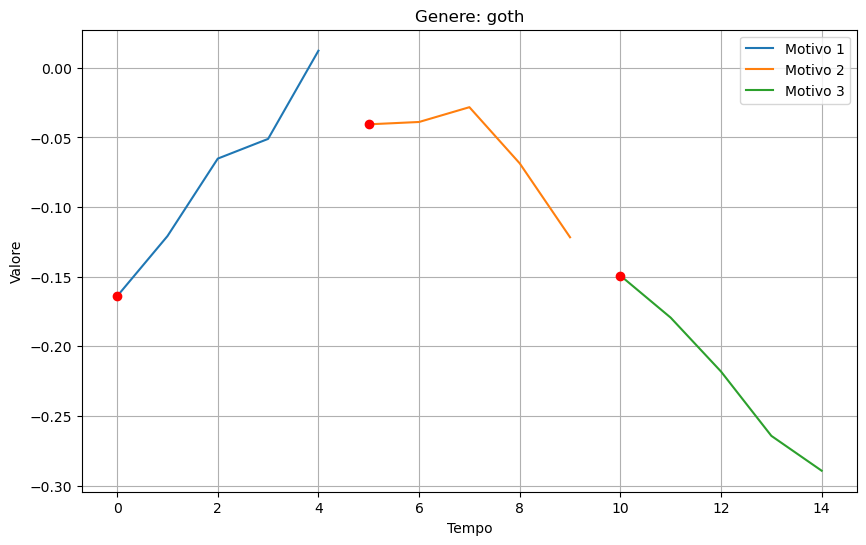

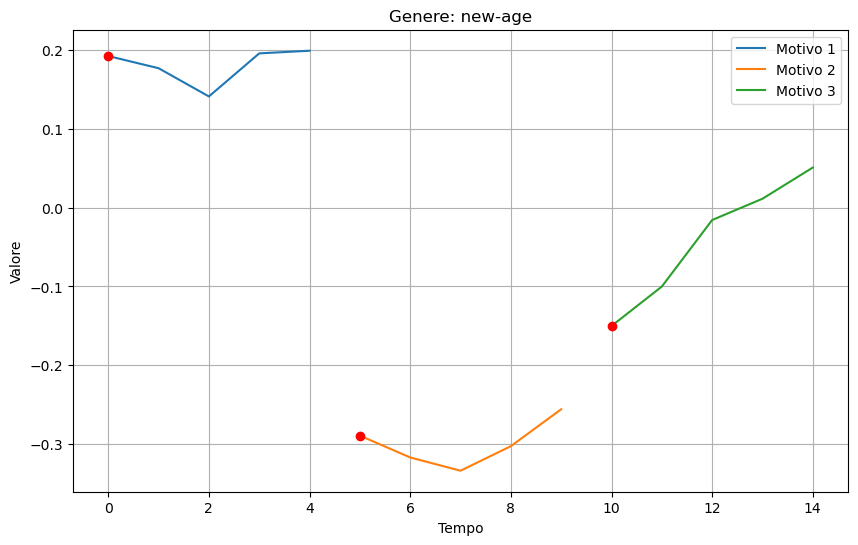

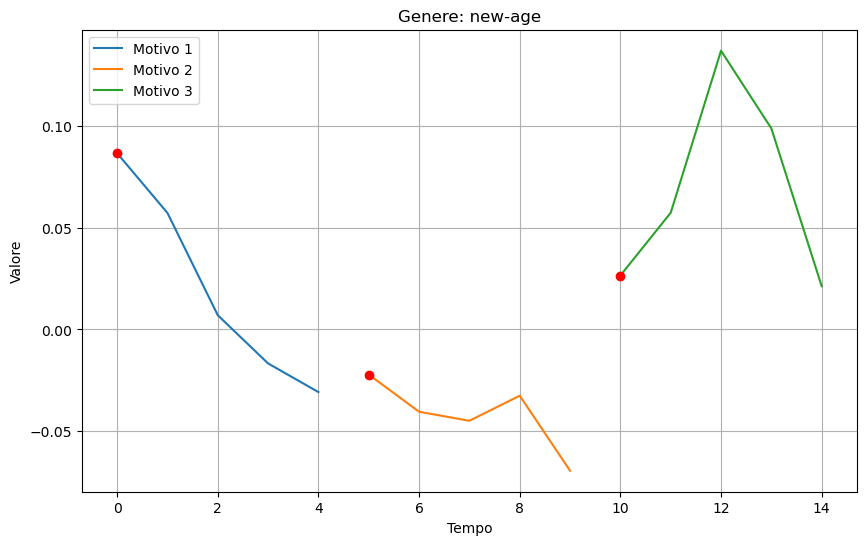

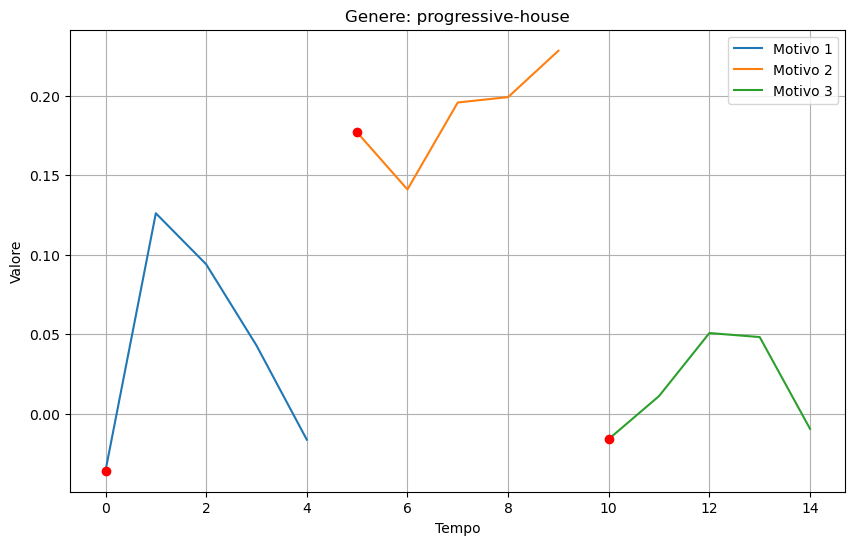

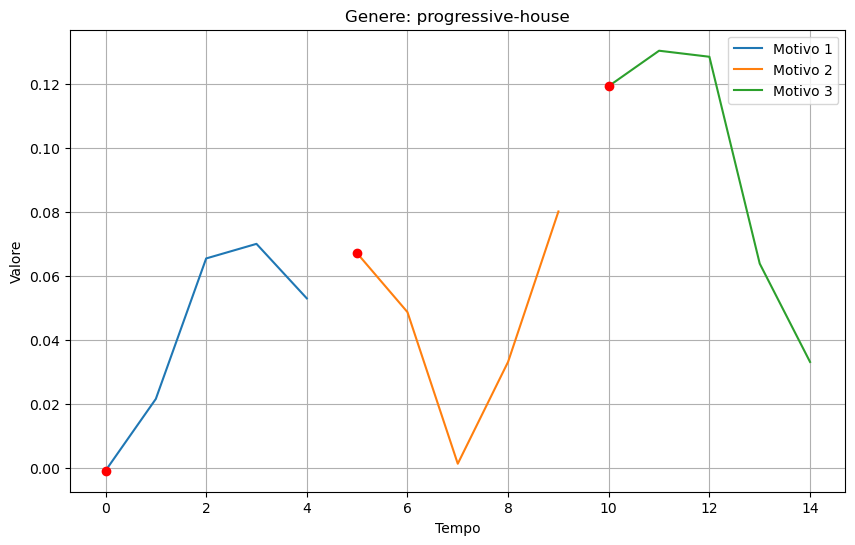

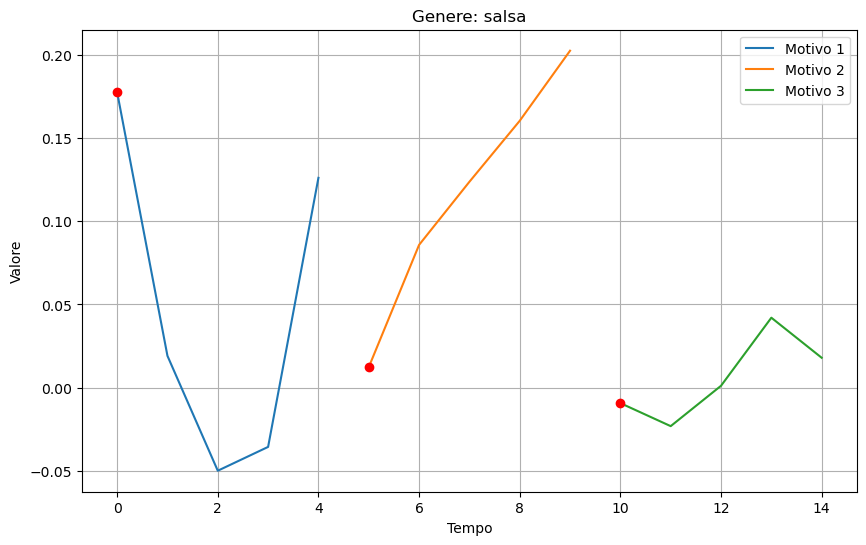

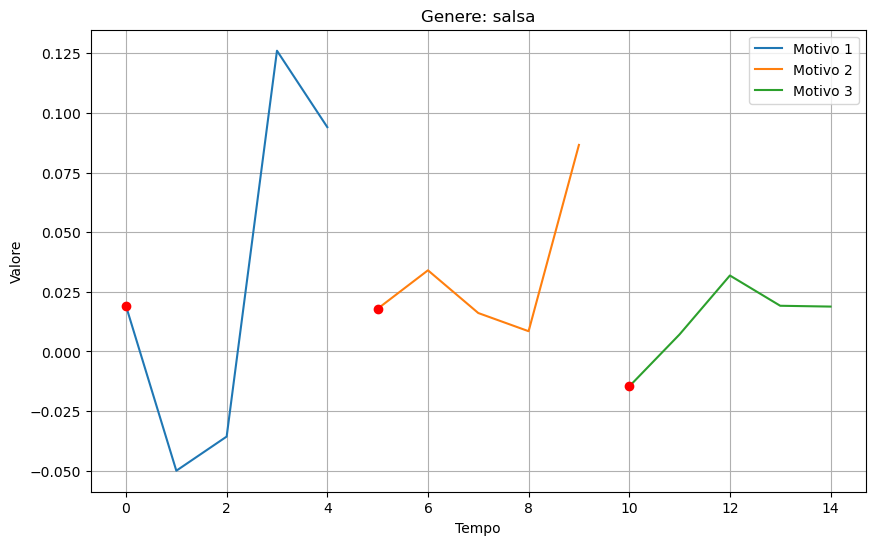

In [19]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 2

# Iteriamo su ogni genere
for genere in generi_unici:
    # Se il genere non è 'emo' o 'rock', passa al prossimo genere
    if genere not in ['progressive-house', 'new-age', 'salsa', 'goth']:
        continue
    
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


In [68]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_B_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_B = cluster_B_data['genre'].value_counts()

print(frequenza_generi_cluster_B)


kids                 8
mpb                  6
sertanejo            6
sleep                6
minimal-techno       5
world-music          5
honky-tonk           5
piano                4
emo                  4
songwriter           4
folk                 3
j-idol               3
happy                3
synth-pop            3
new-age              3
progressive-house    2
salsa                2
heavy-metal          1
goth                 1
opera                1
Name: genre, dtype: int64


In [70]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_C_data = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_C = cluster_C_data['genre'].value_counts()

print(frequenza_generi_cluster_C)


heavy-metal          8
opera                7
emo                  5
goth                 5
sleep                5
j-idol               5
synth-pop            5
sertanejo            4
minimal-techno       4
world-music          4
piano                4
folk                 4
mpb                  4
honky-tonk           4
happy                3
salsa                3
songwriter           2
kids                 2
progressive-house    1
new-age              1
Name: genre, dtype: int64


## Popolarità 

In [ ]:
dataset_merged_after_c.columns

In [73]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_A = cluster_A['popularity'].mean()

print("Media di popolarità per il cluster A:", media_popolarita_cluster_A)

Media di popolarità per il cluster A: 34.77615176151762


In [74]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_B = cluster_B['popularity'].mean()

print("Media di popolarità per il cluster B:", media_popolarita_cluster_B)

Media di popolarità per il cluster B: 34.306666666666665


In [75]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_C = cluster_C['popularity'].mean()

print("Media di popolarità per il cluster C:", media_popolarita_cluster_C)

Media di popolarità per il cluster C: 33.425


## Duration

In [76]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_duration_cluster_A = cluster_A['duration_ms'].mean()

print("Media di duration per il cluster A:", media_duration_cluster_A)

Media di duration per il cluster A: 239.2080975609758


In [77]:
# Seleziona solo le righe relative al cluster B
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_duration_cluster_B = cluster_B['duration_ms'].mean()

print("Media di duration per il cluster B:", media_duration_cluster_B)

Media di duration per il cluster B: 217.38613333333322


In [78]:
# Seleziona solo le righe relative al cluster C
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_duration_cluster_C = cluster_C['duration_ms'].mean()

print("Media di duration per il cluster C:", media_duration_cluster_C)

Media di duration per il cluster C: 243.16012500000002


## Danceability

In [79]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_danceability_cluster_A = cluster_A['danceability'].mean()

print("Media di danzabilità per il cluster A:", media_danceability_cluster_A)

Media di danzabilità per il cluster A: 0.5287642276422764


In [80]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_danceability_cluster_B = cluster_B['danceability'].mean()

print("Media di danzabilità per il cluster B:", media_danceability_cluster_B)

Media di danzabilità per il cluster B: 0.5393333333333332


In [81]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_danceability_cluster_C = cluster_C['danceability'].mean()

print("Media di danzabilità per il cluster C:", media_danceability_cluster_C)

Media di danzabilità per il cluster C: 0.49474999999999997


## Valence 

In [82]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_valence_cluster_A = cluster_A['valence'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [83]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_valence_cluster_B = cluster_B['valence'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [84]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_valence_cluster_C = cluster_C['valence'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## Energy

In [85]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['energy'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [86]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['energy'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [87]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['energy'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## acousticness

In [90]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['acousticness'].mean()

print("Media di acousticness per il cluster A:", media_valence_cluster_A)

Media di acousticness per il cluster A: 0.4257886178861782


In [91]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['acousticness'].mean()

print("Media di acousticness per il cluster B:", media_valence_cluster_B)

Media di acousticness per il cluster B: 0.44400000000000006


In [92]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['acousticness'].mean()

print("Media di acousticness per il cluster C:", media_valence_cluster_C)

Media di acousticness per il cluster C: 0.44187500000000013


## Liveness

In [94]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_liveness_cluster_A = cluster_A['liveness'].mean()

print("Media di liveness per il cluster A:", media_liveness_cluster_A)

Media di liveness per il cluster A: 0.2242872628726293


In [95]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_liveness_cluster_B = cluster_B['liveness'].mean()

print("Media di liveness per il cluster B:", media_liveness_cluster_B)

Media di liveness per il cluster B: 0.26786666666666664


In [96]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_liveness_cluster_C = cluster_C['liveness'].mean()

print("Media di liveness per il cluster C:", media_liveness_cluster_C)

Media di liveness per il cluster C: 0.23962499999999998


## N bars

In [97]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_n_bars_cluster_A = cluster_A['n_bars'].mean()

print("Media di n bars per il cluster A:", media_n_bars_cluster_A)

Media di n bars per il cluster A: 122.38915989159892


In [98]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_n_bars_cluster_B = cluster_B['n_bars'].mean()

print("Media di n bars per il cluster B:", media_n_bars_cluster_B)

Media di n bars per il cluster B: 107.0


In [99]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_n_bars_cluster_C = cluster_C['n_bars'].mean()

print("Media di n bars per il cluster C:", media_n_bars_cluster_C)

Media di n bars per il cluster C: 128.7625


## Estrazione motif più rappresentativi

In [102]:
dataset_merged_after_c.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [113]:
# Lista dei generi più frequenti
generi_rappresentativi = ['progressive-house', 'new-age', 'salsa', 'goth', 'songwriter', 'happy']

# Step 1: Seleziona solo i dati relativi ai generi più frequenti nel cluster A
dati_generi_frequenti = dataset_merged_after_c[dataset_merged_after_c['genre'].isin(generi_rappresentativi)]

# Step 2: Filtra i dati per includere solo le righe con etichetta di cluster 'A'
dati_cluster_A = dati_generi_frequenti[dati_generi_frequenti['Cluster_Label'] == 'A']

# Step 3: Estrai i dati dei motif e dei generi
motif_e_generi_associati = dati_cluster_A[['Motif', 'genre']]

# Ora 'motif_e_generi_associati' contiene sia i dati dei motif che dei generi associati ai generi più frequenti nel cluster A
motif_e_generi_associati


,Motif,genre
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth
6,"[0.19232169535512794, -0.28931324425519145, -0...",new-age
10,"[0.177569741094804, 0.012265179686463816, -0.0...",salsa
23,"[0.010996084282132425, 0.02135896369349284, 0.0]",happy
24,"[0.01907160082182441, 0.017923112688859152, -0...",salsa
...,...,...
1994,"[-0.2642727869360493, -0.15021012143150622, 0....",salsa
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa


In [116]:
# Lista dei generi più frequenti
generi_rappresentativi = ['progressive-house', 'new-age', 'salsa', 'goth', 'songwriter', 'happy']

# Step 1: Seleziona solo i dati relativi ai generi più frequenti nel cluster A
dati_generi_frequenti = dataset_merged_after_c[dataset_merged_after_c['genre'].isin(generi_rappresentativi)]

# Step 2: Filtra i dati per includere solo le righe con etichetta di cluster 'A'
dati_cluster_A = dati_generi_frequenti[dati_generi_frequenti['Cluster_Label'] == 'A']

# Step 3: Raggruppa i dati per genere e aggrega i motif
motif_raggruppati_per_genere = dati_cluster_A.groupby('genre')['Motif'].apply(list).reset_index()




In [120]:
motif_raggruppati_per_genere

,genre,Motif
0,goth,"[[0.010966835784340198, -0.3338457138023082, 0..."
1,happy,"[[0.010996084282132425, 0.02135896369349284, 0..."
2,new-age,"[[0.19232169535512794, -0.28931324425519145, -..."
3,progressive-house,"[[-0.03565899680020941, 0.17685991628990436, -..."
4,salsa,"[[0.177569741094804, 0.012265179686463816, -0...."
5,songwriter,"[[-0.14423378954133048, -0.09272366725537612, ..."


In [126]:
import pandas as pd

# Supponiamo che 'motif_raggruppati_per_genere' sia il DataFrame contenente i motif raggruppati per genere

# Calcola la correlazione di Pearson
correlazione_pearson = dataset_merged_after_c.set_index('genre').corr(method='pearson')

# Calcola la correlazione di Spearman
correlazione_spearman = motif_raggruppati_per_genere.set_index('genre').corr(method='spearman')

# Visualizza le correlazioni
print("Correlazione di Pearson:")
print(correlazione_pearson)
print("\nCorrelazione di Spearman:")
print(correlazione_spearman)


Correlazione di Pearson:
Empty DataFrame
Columns: []
Index: []

Correlazione di Spearman:
Empty DataFrame
Columns: []
Index: []


## Senza PCA

In [46]:
#scaling, normalization
from sklearn.preprocessing import StandardScaler, MinMaxScaler

#kmeans, dbscan, hierarchical (sklearn)
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
#evaluation
from sklearn.metrics import silhouette_score
#import dataset
from sklearn.datasets import load_iris

#distance matrix (dbscan elbow, hierarchical)
from scipy.spatial.distance import pdist, squareform

# hierarchical (scipy)
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster

In [47]:
first_elements

[[-0.03890035178490396, 0.010996084282132425, -0.044839240482655696],
 [-0.10017519152907285, 0.040659776628233564, -0.06191469653133186],
 [0.010966835784340198, -0.3338457138023082, 0.001088733910758793],
 [-0.02318040021042633, 0.0013248255658865286, 0.23248481166178803],
 [0.050840185570961455, -0.11649967694109602, -0.022132684604599603],
 [-0.2181040490337499, -0.3338457138023082, 0.03313188243560628],
 [0.19232169535512794, -0.28931324425519145, -0.15021012143150622],
 [0.24160517772080184, 0.08659714205090542, 0.045448131390106936],
 [0.24160517772080184, -0.15021012143150622, 0.0014925840628656952],
 [-0.12084160075464619, -0.04041042988183319, -0.09272366725537612],
 [0.177569741094804, 0.012265179686463816, -0.00934486145391183],
 [-0.048078031363184115, -0.11649967694109602, -0.05477139374163009],
 [0.05723904670724786, -0.022132684604599603, -0.046891652033747615],
 [-0.012096304455615622, -0.01576149177678871, 0.007171209758129033],
 [0.04304090998243482, 0.19232169535512

In [48]:
scaler = MinMaxScaler()
X_minmax = scaler.fit_transform(first_elements)

In [49]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, n_init=10, max_iter=100, random_state=94)
kmeans.fit(X_minmax)


KMeans(max_iter=100, n_clusters=3, random_state=94)

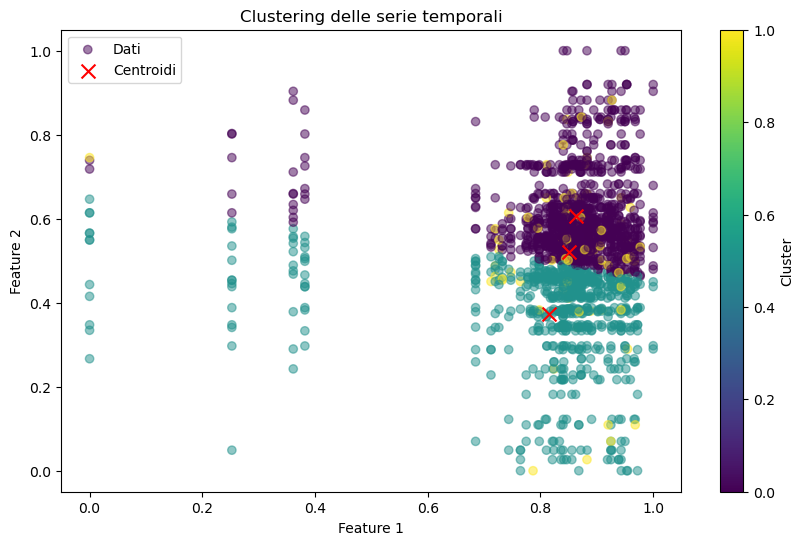

In [50]:
# Plot degli scatter plot colorati per cluster
plt.figure(figsize=(10, 6))

# Estrai le etichette di clustering
labels = kmeans.labels_

# Plot dei punti
plt.scatter(X_minmax[:, 0], X_minmax[:, 1], c=labels, cmap='viridis', alpha=0.5, label='Dati')

# Plot dei centroidi
centroids = kmeans.cluster_centers_
plt.scatter(centroids[:, 0], centroids[:, 1], marker='x', s=100, color='red', label='Centroidi')

# Aggiungi le etichette degli assi
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('Clustering delle serie temporali')

plt.colorbar(label='Cluster')
plt.legend()
plt.show()

In [51]:
df_motif_2={'Motif': first_elements,
        'Genres': y_sampled,
         'ids': ids_sampled}
df_motif_2=pd.DataFrame(df_motif_2)

In [52]:
df_motif_2['Cluster_Label']=kmeans.labels_

In [53]:
df_motif_2['Cluster_Label'] = df_motif_2['Cluster_Label'].map({0:"A", 1: "B", 2: "C"})

In [54]:
df_motif_2

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,B
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,B
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


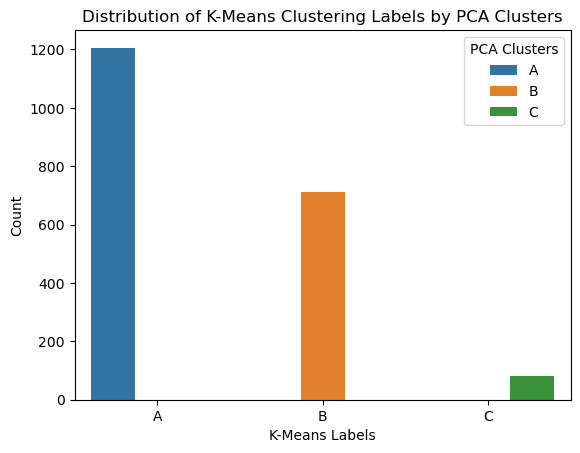

In [55]:
import seaborn as sns

# Plot della distribuzione dei cluster assegnati dalla PCA
sns.countplot(data=df_motif_2, x='Cluster_Label', hue='Cluster_Label')
plt.xlabel('K-Means Labels')
plt.ylabel('Count')
plt.title('Distribution of K-Means Clustering Labels by PCA Clusters')
plt.legend(title='PCA Clusters')
plt.show()


In [56]:
df_motif_2.columns

Index(['Motif', 'Genres', 'ids', 'Cluster_Label'], dtype='object')

In [57]:
df_motif_2

,Motif,Genres,ids,Cluster_Label
0,"[-0.03890035178490396, 0.010996084282132425, -...",opera,3HUMNxBQoCPTg2K8wi7oFb,A
1,"[-0.10017519152907285, 0.040659776628233564, -...",minimal-techno,0vgIkHFK8wpogVc1XCi18F,A
2,"[0.010966835784340198, -0.3338457138023082, 0....",goth,0Av7W8Abdx761b2Ey5wo1u,B
3,"[-0.02318040021042633, 0.0013248255658865286, ...",opera,5KIuAOpwX3UHISVwuBhG2J,A
4,"[0.050840185570961455, -0.11649967694109602, -...",minimal-techno,1e6YswGTpMvjk21TQAxfXw,B
...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",songwriter,6LDocxGe28oGm8GvPq8Msv,B
1996,"[0.09404628435396538, -0.012281816544729486, 0...",salsa,1sMoMqcOp0Rx7ObqDNs2Wp,A
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",salsa,2lW5yKm8tZxLTleYMkyAft,A
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",salsa,3JsLg8mtMCWmbxlvf7l768,A


## Merge 

In [58]:
dataset_2=pd.read_csv('nuovo_dataset_totale.csv')

In [59]:
dataset_2

,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,album_type,album_name,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,4rjA5kJJWbwU1prXCvg6Fk,Grey,1.0,290.48,False,52.0,5.0,Kölsch,album,1989,...,0.24,186.00,3.0,0.02,1.00,0.50,0.52,234.0,minimal-techno,[51.0]
1,6xzpUzzIquIyUzTLbbgSdI,Thrown,1.0,539.23,False,45.0,5.0,Kiasmos,album,Kiasmos,...,0.14,120.02,4.0,0.68,0.33,0.41,0.59,269.0,minimal-techno,[47.0]
2,56tXgHlSHCfgmGhwVXNizc,Routine,1.0,264.20,False,39.0,5.0,Joris Delacroix,album,Night Visions,...,0.32,118.05,3.0,0.85,0.46,0.90,0.76,171.0,minimal-techno,[44.0]
3,0s3wIBczp6TdSJ2y8cveJl,Confronted - Anfisa Letyago Stranger Remix,1.0,387.41,False,0.0,6.0,Pan-Pot;Anfisa Letyago,single,Confronted Remixes,...,0.04,128.99,4.0,0.88,0.50,0.51,0.50,207.0,minimal-techno,"[36.0, 40.0]"
4,4PSbDDd1LRYMhqPXvza6I2,Jupiter Sunrise,1.0,248.96,False,0.0,1.0,Kollektiv Turmstrasse,compilation,10 Years Diynamic,...,0.12,120.00,4.0,0.88,1.00,0.47,0.46,123.0,minimal-techno,[45.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
109144,0wiDjWz3U1WfwXSrWHXe2b,I'm Good (Blue) - REAPER Extended Remix,1.0,209.66,True,23.0,2.0,David Guetta;Bebe Rexha;REAPER,single,I'm Good (Blue) [REAPER Remix],...,0.37,173.96,4.0,0.73,1.00,0.09,0.18,145.0,edm,"[86.0, 79.0, 50.0]"
109145,46n9OJc7LOIVdj8t2l5WA5,End Of The Night,1.0,205.72,True,56.0,1.0,Danny Avila,single,End Of The Night,...,0.31,99.97,4.0,0.71,1.00,0.40,0.54,84.0,edm,[47.0]
109146,127uq83uGFapbddqiMUKky,Sexy Bitch (feat. Akon),1.0,195.85,True,80.0,3.0,David Guetta;Akon,album,One More Love,...,0.80,130.01,4.0,0.81,0.99,0.10,0.33,106.0,edm,"[86.0, 79.0]"
109147,0ZdUHFxifUJNqo7G4aJzoF,Savannah,1.0,208.70,False,60.0,1.0,Diviners;Philly K.,single,Savannah,...,0.39,108.07,4.0,0.65,1.00,0.55,0.60,89.0,edm,"[47.0, 38.0]"


In [60]:
dataset_merged_after_c_2 = pd.merge(df_motif_2, dataset_2, left_on=['ids', 'Genres'], right_on=['id', 'genre'], how='inner')

In [61]:
dataset_merged_after_c_2=dataset_merged_after_c_2.drop(['ids', 'Genres'], axis=1)

In [62]:
dataset_merged_after_c_2

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
2,"[0.010966835784340198, -0.3338457138023082, 0....",B,0Av7W8Abdx761b2Ey5wo1u,The Drowning (feat. R. Williams),1.0,244.96,True,28.0,3.0,Christian Death;R.Williams,...,0.30,121.73,4.0,0.75,0.99,0.00,0.23,121.0,goth,"[41.0, 19.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
4,"[0.050840185570961455, -0.11649967694109602, -...",B,1e6YswGTpMvjk21TQAxfXw,No Road Without a Turn,1.0,278.01,False,30.0,8.0,Mano Le Tough,...,0.65,86.35,4.0,0.22,1.00,0.23,0.27,99.0,minimal-techno,[36.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,"[-1.110185218190923, -0.09272366725537612, 0.2...",B,6LDocxGe28oGm8GvPq8Msv,Waterproof Mascara,1.0,211.16,False,0.0,23.0,Sheryl Crow,...,0.29,137.88,4.0,0.14,0.97,0.68,0.78,118.0,songwriter,[65.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]
1998,"[-0.14423378954133048, 0.04200588671248265, -0...",A,3JsLg8mtMCWmbxlvf7l768,Me Cogió La Noche,1.0,243.96,False,21.0,1.0,Gilberto Santa Rosa,...,0.76,99.03,4.0,0.48,1.00,0.46,0.57,98.0,salsa,[66.0]


In [63]:
dataset_merged_after_c_2['valence']

0       0.11
1       0.18
2       0.30
3       0.07
4       0.65
        ... 
1995    0.29
1996    0.92
1997    0.75
1998    0.76
1999    0.38
Name: valence, Length: 2000, dtype: float64

## Analisi delle correlazioni

In [64]:
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

In [65]:
cluster_A

,Motif,Cluster_Label,id,name,disc_number,duration_ms,explicit,popularity,track_number,artists,...,valence,tempo,time_signature,tempo_confidence,time_signature_confidence,key_confidence,mode_confidence,n_bars,genre,popularity_artist
0,"[-0.03890035178490396, 0.010996084282132425, -...",A,3HUMNxBQoCPTg2K8wi7oFb,Verdi: Messa da Requiem: IX. Ingemisco,3.0,224.11,False,29.0,11.0,Giuseppe Verdi;Riccardo Muti;Luciano Pavarotti...,...,0.11,85.24,5.0,0.04,0.02,0.53,0.53,78.0,opera,"[58.0, 52.0, 60.0, 48.0]"
1,"[-0.10017519152907285, 0.040659776628233564, -...",A,0vgIkHFK8wpogVc1XCi18F,Second Sun,1.0,224.33,False,30.0,1.0,Nils Hoffmann;Ben Böhmer,...,0.18,120.00,4.0,0.70,0.60,1.00,0.96,112.0,minimal-techno,"[56.0, 62.0]"
3,"[-0.02318040021042633, 0.0013248255658865286, ...",A,5KIuAOpwX3UHISVwuBhG2J,L’arlésienne Suite No. 2 (Arr. E. Guiraud): II...,1.0,259.27,False,22.0,18.0,Georges Bizet;Orquestra Simfònica de Barcelona...,...,0.07,65.63,4.0,0.03,0.42,0.69,0.67,69.0,opera,"[56.0, 45.0, 45.0]"
7,"[0.24160517772080184, 0.08659714205090542, 0.0...",A,3SdJZFJWYHymvxUrMPAXdQ,Táxi Lunar (Ao Vivo),1.0,237.27,False,45.0,2.0,Zé Ramalho,...,0.69,150.74,4.0,0.02,0.92,0.39,0.41,150.0,mpb,[62.0]
10,"[0.177569741094804, 0.012265179686463816, -0.0...",A,4SZI76W5PRBao0BhhIACpv,Vergüenza - Remastered,1.0,217.29,False,18.0,51.0,La Sonora Matancera,...,0.61,92.05,4.0,0.03,0.91,0.42,0.59,81.0,salsa,[54.0]
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991,"[0.021296595150445057, 0.08659714205090542, -0...",A,28Obqqr7EtnSNul1TJiQcX,Oh Love,1.0,164.67,False,44.0,1.0,Delaney Bailey,...,0.56,148.10,4.0,0.55,0.98,0.33,0.41,96.0,songwriter,[57.0]
1992,"[0.25190315172445804, -0.0008595053556812499, ...",A,7qvGRrYCEOXLkg3ax9mfUb,Atrevida,1.0,276.89,False,45.0,13.0,Grupo Niche,...,0.92,93.28,4.0,0.02,1.00,0.30,0.44,106.0,salsa,[67.0]
1996,"[0.09404628435396538, -0.012281816544729486, 0...",A,1sMoMqcOp0Rx7ObqDNs2Wp,A Donde Iras,1.0,293.48,False,33.0,1.0,Luisito Ayala Y La Puerto Rican Power,...,0.92,92.63,4.0,0.31,1.00,0.66,0.73,111.0,salsa,[55.0]
1997,"[-0.04997606528539334, 0.19905286560014646, 0....",A,2lW5yKm8tZxLTleYMkyAft,Pensamiento y Palabra,1.0,288.37,False,37.0,11.0,Víctor Manuelle,...,0.75,91.79,4.0,0.15,0.86,0.25,0.43,111.0,salsa,[62.0]


In [66]:
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

In [ ]:
from tslearn.shapelets import ShapeletModel, grabocka_params_to_shapelet_size_dict
import numpy as np

# Supponiamo che 'dataframe' sia il tuo DataFrame con la colonna di vettori di motif

# Estrai i vettori di motif dal DataFrame
motif_vectors = np.array(cluster_A['Motif'].tolist())

# Imposta i parametri per l'algoritmo FSD
shapelet_sizes = grabocka_params_to_shapelet_size_dict(n_shapelets_per_size={10: 5})
shp_clf = ShapeletModel(n_shapelets_per_size=shapelet_sizes,
                         optimizer="sgd", weight_regularizer=0.01,
                         max_iter=200, verbose_level=0)

# Addestra l'algoritmo FSD sui tuoi dati di serie temporali
shp_clf.fit(motif_vectors, y_train)  # Assumi che 'y_train' sia l'etichetta associata a ciascuna serie temporale

# Ottieni gli shapelet identificati
shapelets = shp_clf.shapelets_

# Visualizza gli shapelet identificati
for idx, shapelet in enumerate(shapelets):
    print(f"Shapelet {idx + 1}: Length {len(shapelet)}")


## Popolarità 

In [71]:
dataset_merged_after_c_2.columns

Index(['Motif', 'Cluster_Label', 'id', 'name', 'disc_number', 'duration_ms',
       'explicit', 'popularity', 'track_number', 'artists', 'album_type',
       'album_name', 'album_release_date', 'album_release_date_precision',
       'album_total_tracks', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'time_signature', 'tempo_confidence',
       'time_signature_confidence', 'key_confidence', 'mode_confidence',
       'n_bars', 'genre', 'popularity_artist'],
      dtype='object')

In [72]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_A = cluster_A['popularity'].mean()

print("Media di popolarità per il cluster A:", media_popolarita_cluster_A)

Media di popolarità per il cluster A: 34.82835820895522


In [75]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_B = cluster_B['popularity'].mean()

print("Media di popolarità per il cluster B:", media_popolarita_cluster_B)

Media di popolarità per il cluster B: 34.62692847124825


In [76]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']

# Calcola la media di popolarità per il cluster A
media_popolarita_cluster_C = cluster_C['popularity'].mean()

print("Media di popolarità per il cluster C:", media_popolarita_cluster_C)

Media di popolarità per il cluster C: 33.54320987654321


## Duration

In [77]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_duration_cluster_A = cluster_A['duration_ms'].mean()

print("Media di duration per il cluster A:", media_duration_cluster_A)

Media di duration per il cluster A: 238.28440298507454


In [78]:
# Seleziona solo le righe relative al cluster B
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_duration_cluster_B = cluster_B['duration_ms'].mean()

print("Media di duration per il cluster B:", media_duration_cluster_B)

Media di duration per il cluster B: 238.50478260869556


In [79]:
# Seleziona solo le righe relative al cluster C
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_duration_cluster_C = cluster_C['duration_ms'].mean()

print("Media di duration per il cluster C:", media_duration_cluster_C)

Media di duration per il cluster C: 242.8495061728395


## Danceability

In [80]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_danceability_cluster_A = cluster_A['danceability'].mean()

print("Media di danzabilità per il cluster A:", media_danceability_cluster_A)

Media di danzabilità per il cluster A: 0.5246185737976778


In [81]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_danceability_cluster_B = cluster_B['danceability'].mean()

print("Media di danzabilità per il cluster B:", media_danceability_cluster_B)

Media di danzabilità per il cluster B: 0.5372650771388491


In [82]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_danceability_cluster_C = cluster_C['danceability'].mean()

print("Media di danzabilità per il cluster C:", media_danceability_cluster_C)

Media di danzabilità per il cluster C: 0.4918518518518517


## Valence 

In [83]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']


media_valence_cluster_A = cluster_A['valence'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.42194029850746206


In [84]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']


media_valence_cluster_B = cluster_B['valence'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.4345441795231416


In [85]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']


media_valence_cluster_C = cluster_C['valence'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.4387654320987655


## Energy

In [85]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['energy'].mean()

print("Media di valence per il cluster A:", media_valence_cluster_A)

Media di valence per il cluster A: 0.4257886178861782


In [86]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['energy'].mean()

print("Media di valence per il cluster B:", media_valence_cluster_B)

Media di valence per il cluster B: 0.44400000000000006


In [87]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['energy'].mean()

print("Media di valence per il cluster C:", media_valence_cluster_C)

Media di valence per il cluster C: 0.44187500000000013


## acousticness

In [90]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_energy_cluster_A = cluster_A['acousticness'].mean()

print("Media di acousticness per il cluster A:", media_valence_cluster_A)

Media di acousticness per il cluster A: 0.4257886178861782


In [91]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_energy_cluster_B = cluster_B['acousticness'].mean()

print("Media di acousticness per il cluster B:", media_valence_cluster_B)

Media di acousticness per il cluster B: 0.44400000000000006


In [92]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_energy_cluster_C = cluster_C['acousticness'].mean()

print("Media di acousticness per il cluster C:", media_valence_cluster_C)

Media di acousticness per il cluster C: 0.44187500000000013


## Liveness

In [94]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_liveness_cluster_A = cluster_A['liveness'].mean()

print("Media di liveness per il cluster A:", media_liveness_cluster_A)

Media di liveness per il cluster A: 0.2242872628726293


In [95]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_liveness_cluster_B = cluster_B['liveness'].mean()

print("Media di liveness per il cluster B:", media_liveness_cluster_B)

Media di liveness per il cluster B: 0.26786666666666664


In [96]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_liveness_cluster_C = cluster_C['liveness'].mean()

print("Media di liveness per il cluster C:", media_liveness_cluster_C)

Media di liveness per il cluster C: 0.23962499999999998


## N bars

In [97]:
# Seleziona solo le righe relative al cluster A
cluster_A = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'A']


media_n_bars_cluster_A = cluster_A['n_bars'].mean()

print("Media di n bars per il cluster A:", media_n_bars_cluster_A)

Media di n bars per il cluster A: 122.38915989159892


In [98]:
# Seleziona solo le righe relative al cluster A
cluster_B = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'B']


media_n_bars_cluster_B = cluster_B['n_bars'].mean()

print("Media di n bars per il cluster B:", media_n_bars_cluster_B)

Media di n bars per il cluster B: 107.0


In [99]:
# Seleziona solo le righe relative al cluster A
cluster_C = dataset_merged_after_c[dataset_merged_after_c['Cluster_Label'] == 'C']


media_n_bars_cluster_C = cluster_C['n_bars'].mean()

print("Media di n bars per il cluster C:", media_n_bars_cluster_C)

Media di n bars per il cluster C: 128.7625


In [86]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_A_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'A']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_A = cluster_A_data['genre'].value_counts()

print(frequenza_generi_cluster_A)


happy                71
world-music          70
folk                 66
synth-pop            65
salsa                65
sertanejo            64
opera                63
piano                60
honky-tonk           59
songwriter           59
sleep                58
progressive-house    58
minimal-techno       57
emo                  57
new-age              57
kids                 57
j-idol               56
goth                 56
heavy-metal          56
mpb                  52
Name: genre, dtype: int64


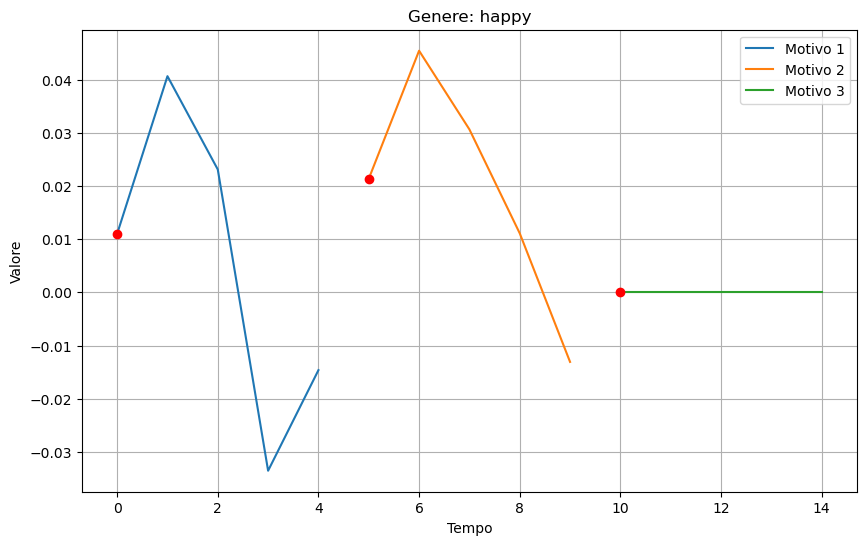

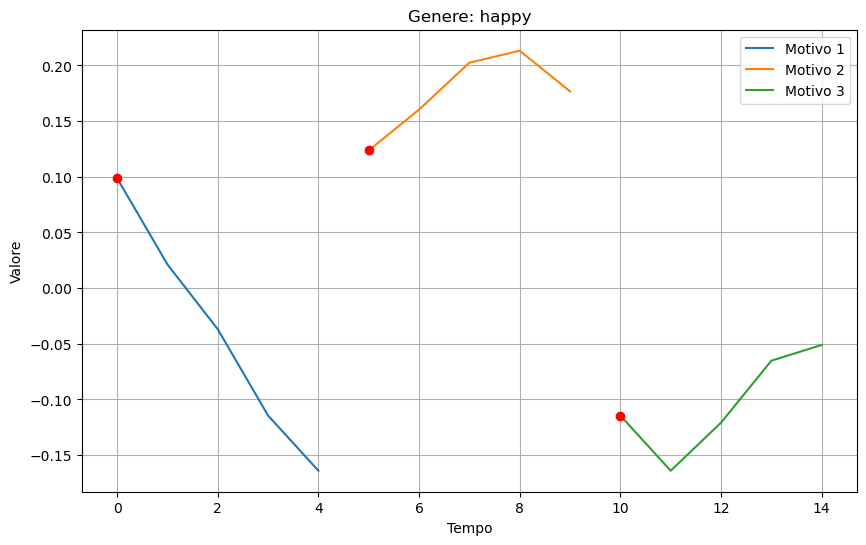

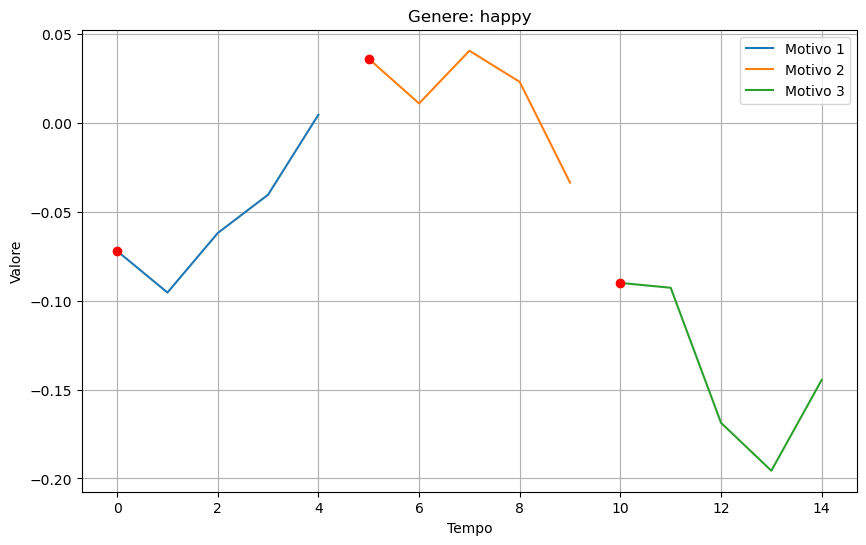

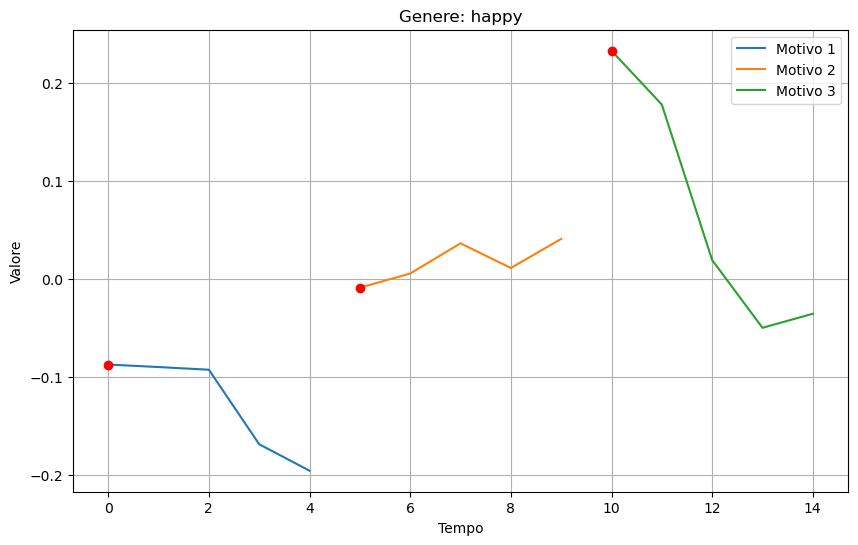

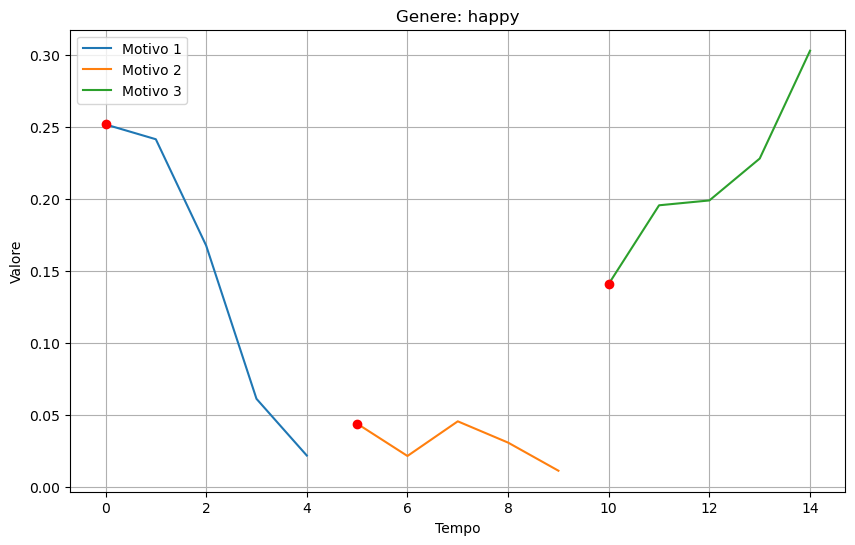

...

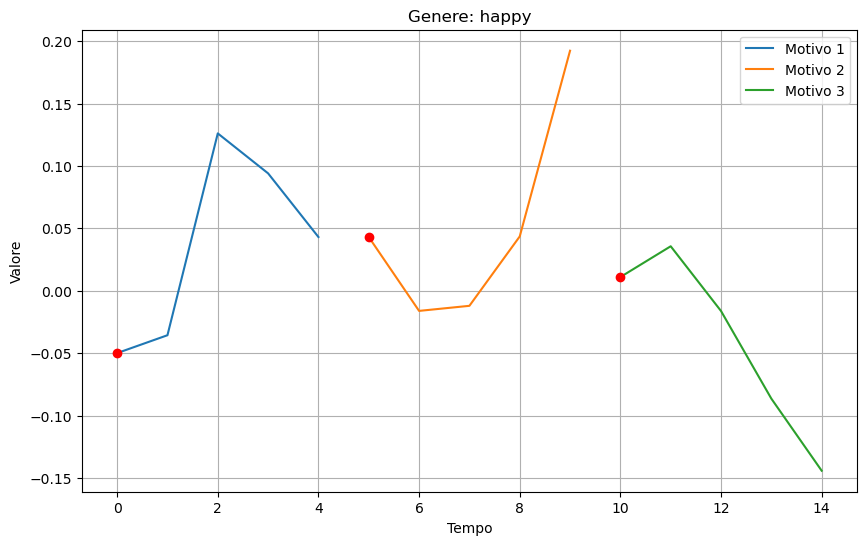

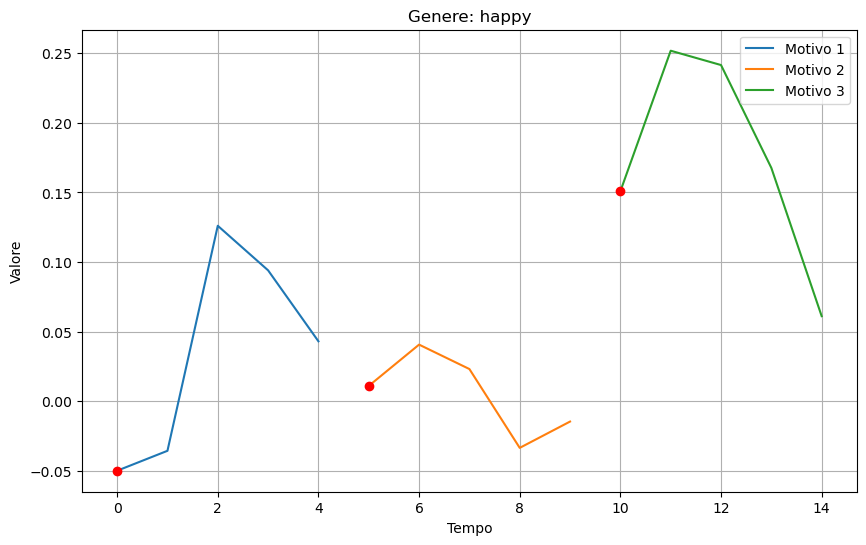

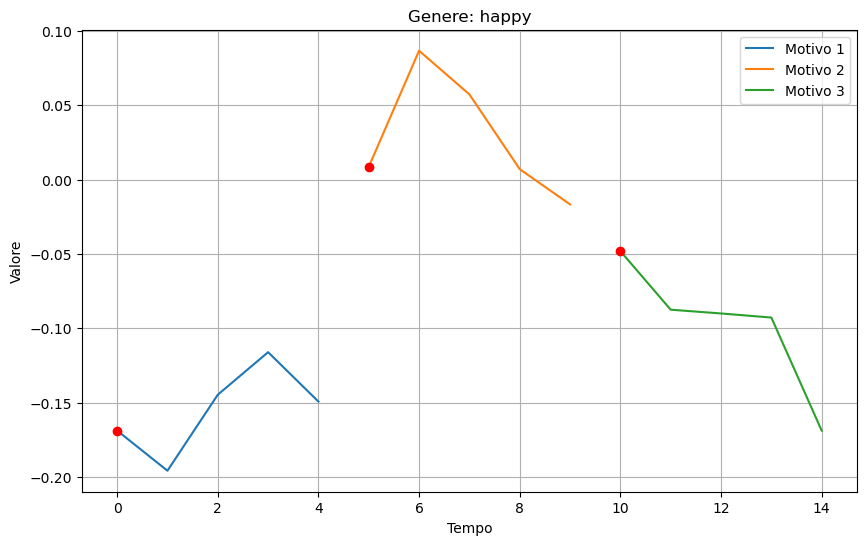

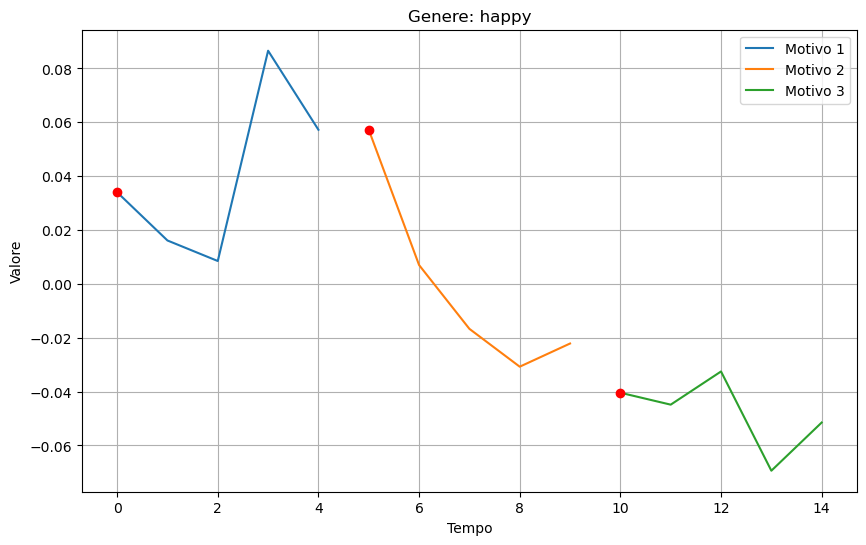

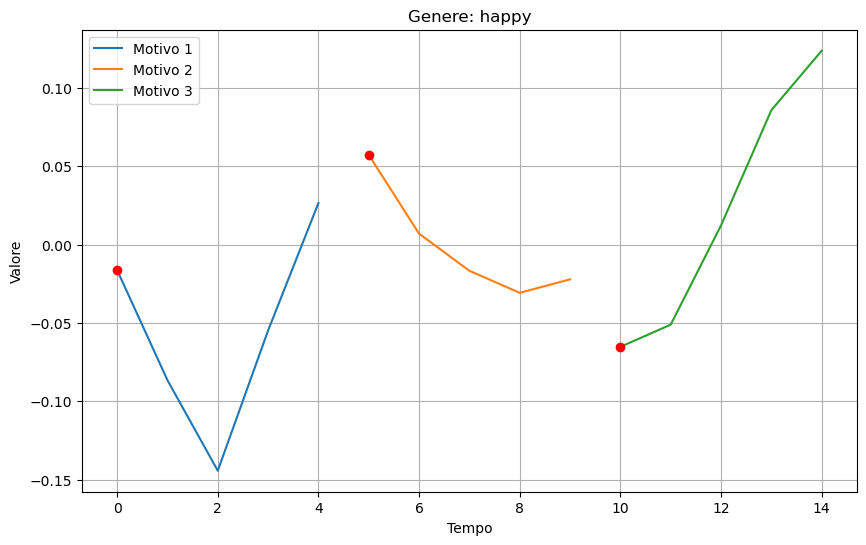

In [31]:
import numpy as np
import matplotlib.pyplot as plt

# Supponiamo di avere le seguenti informazioni:
# y_sampled: Array contenente l'ordine dei generi a cui appartengono le serie temporali
# motif_array: Array numpy contenente i motivi estratti
# first_elements: Lista contenente i primi elementi di ogni motivo interno

# Generi presenti nei dati
generi_unici = np.unique(y_sampled)

# Numero massimo di serie temporali da visualizzare per ogni genere
num_serie_per_genere = 50

# Iteriamo su ogni genere
for genere in generi_unici:
    # Se il genere non è 'emo' o 'rock', passa al prossimo genere
    if genere not in ['happy']:
        continue
    
    # Trova gli indici delle serie temporali appartenenti al genere corrente
    indici_genere = np.where(y_sampled == genere)[0]
    
    # Prendiamo solo le prime due serie temporali del genere
    indici_serie_da_visualizzare = indici_genere[:num_serie_per_genere]
    
    # Iteriamo su ogni serie temporale da visualizzare per il genere corrente
    for indice_serie in indici_serie_da_visualizzare:
        # Nome del genere
        nome_genere = f'Genere: {genere}'
        
        # Serie temporale corrente
        serie_temporale = motif_array[indice_serie]
        
        # Primi elementi dei motivi interni
        primi_elementi_motivi = first_elements[indice_serie]
        
        # Creazione del grafico
        plt.figure(figsize=(10, 6))
        
        # Grano in cima con il nome del genere
        plt.title(nome_genere)
        
        # Serie temporale con i motivi rappresentati
        for i, motivo in enumerate(serie_temporale):
            plt.plot(np.arange(len(motivo)) + i * len(motivo), motivo, label=f'Motivo {i+1}')
            plt.scatter(i * len(motivo), primi_elementi_motivi[i], color='red', zorder=5)
        
        # Impostazioni aggiuntive del grafico
        plt.xlabel('Tempo')
        plt.ylabel('Valore')
        plt.legend()
        plt.grid(True)
        plt.show()


In [87]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_B_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'B']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_B = cluster_B_data['genre'].value_counts()

print(frequenza_generi_cluster_B)


mpb                  44
new-age              42
progressive-house    41
kids                 41
goth                 39
songwriter           39
minimal-techno       39
j-idol               39
emo                  38
honky-tonk           37
sleep                37
heavy-metal          36
piano                35
salsa                32
sertanejo            32
folk                 30
synth-pop            30
opera                30
world-music          26
happy                26
Name: genre, dtype: int64


In [88]:
# Filtra il dataframe per ottenere solo le righe con etichetta di cluster 'A'
cluster_C_data = dataset_merged_after_c_2[dataset_merged_after_c_2['Cluster_Label'] == 'C']

# Calcola la frequenza dei generi musicali per il cluster 'A'
frequenza_generi_cluster_C = cluster_C_data['genre'].value_counts()

print(frequenza_generi_cluster_C)


heavy-metal          8
opera                7
emo                  5
j-idol               5
synth-pop            5
sleep                5
piano                5
goth                 5
sertanejo            4
world-music          4
minimal-techno       4
folk                 4
mpb                  4
honky-tonk           4
happy                3
salsa                3
songwriter           2
kids                 2
progressive-house    1
new-age              1
Name: genre, dtype: int64
